<a href="https://colab.research.google.com/github/yodavo/IAI_vaccines/blob/main/%203.Modelamiento_NoSupervisado.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install kneed

# Para importar la data
import os

# Importar para manipulacion de datos
import numpy as np
import pandas as pd
import datetime as dt
from statistics import *

# Importar para Visualizacion 
import matplotlib.pyplot as plt
import missingno as msno
import seaborn as sns
sns.set(style="ticks", context='talk', palette='rainbow')
import warnings # para evitar warnings
warnings.filterwarnings('ignore')
import textwrap
from textwrap import wrap
import matplotlib.dates as mdates
from matplotlib.dates import DateFormatter

# Importar Dependencias
%matplotlib inline
# %load_ext google.colab.data_table

# Machine Learning
from mpl_toolkits import mplot3d
import seaborn as sns
from kneed import KneeLocator
from sklearn.cluster import KMeans

In [88]:
 from google.colab import drive
drive.mount('/content/drive')

# Entrando a la carpeta de trabajo
%cd '/content/drive/MyDrive/Colab Notebooks/Diplomado-UTEC/Modulo5/dataset'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive/Colab Notebooks/Diplomado-UTEC/Modulo5/dataset


In [93]:
# importar de VAERSData
data = pd.read_csv('dataset_aesi(final).csv', index_col=0, encoding='latin-1')
print(f'VAER Pfizer-Hospitalized Data tiene\t: {data.shape[0]} observaciones y {data.shape[1]} variables.')

VAER Pfizer-Hospitalized Data tiene	: 2210 observaciones y 42 variables.


In [94]:
# eliminando datos que no aportan
data.reset_index(inplace=True)
# eliminando datos que no aportan
data.drop(["VAERS_ID","recvdate","vax_lot"], axis = 1, inplace=True)
print(f'El dataset tiene\t: {data.shape[0]} observaciones y {data.shape[1]} variables.')

El dataset tiene	: 2210 observaciones y 40 variables.


In [95]:
# revisando cantidad de aesis
aesis =  ['infarct_myocardic', 'coagulopathy', 'anaphylactic',
       'myocarditis_pericarditis', 'epilepsy_convulsions', 'covid19',
       'guillain', 'polyneurapathy', 'multisystem', 'narcolepsia', 'pregnancy',
       'stroke', 'transverse_myelitis', 'autoimmuned', 'adem',
       'multipleesclerosis', 'opticneuritis', 'cidp', 'encephalitis',
       'myelitis', 'encephalomyelitis', 'meningitis', 'encephalopathy',
       'ataxia', 'noanaphylactic']

In [96]:
## Variables categóricas binarias convertidas a 0 y 1
data['sex']=data['sex'].apply(lambda x : 0 if x == 'M' else 1) ## 0 para Maculinos , 1 para Femenino
data['died']=data['died'].apply(lambda x : 0 if x == 'N' else 1) ## 0 para N "NO FALLECIDO" , 1 para Y "FALLECIDO"

### ELIMINAR VARIABLES QUE NO SE PUEDEN REPETIR EN OTROS PAÍSES###
data.drop(['state', 'v_adminby'],axis=1 , inplace=True)

In [103]:
### VARIABLES CATEGÓRICAS DEFINIDAS ###
from sklearn.preprocessing import OrdinalEncoder

ord_enc = OrdinalEncoder()
data['vax_route'] = ord_enc.fit_transform(data[['vax_route']]).astype(int)
data['vax_site'] = ord_enc.fit_transform(data[['vax_site']]).astype(int)
data['recovd'] = ord_enc.fit_transform(data[['recovd']]).astype(int)

In [98]:
# conversion de fechas
data['vax_date'] =  data['vax_date'].apply(pd.to_datetime, format='%Y-%m-%d')
data['onset_date'] =  data['onset_date'].apply(pd.to_datetime, format='%Y-%m-%d')

## Creacion de una nueva variable a partir de las fechas de vacuancion y presencia de efectos adversos
data['onset_vax'] = (data['onset_date'] - data['vax_date']).astype('timedelta64[D]').astype('int')

In [99]:
# coreciones manuales, en el mayor de los casos las fechas estan invertdas
data['onset_vax'] = np.where(data['onset_vax'] < 0, data['onset_vax']*-1, data['onset_vax'])

In [100]:
# eliminamos variables de fechas
data.drop(columns= ['vax_date', 'onset_date'], inplace=True)

#reordenamos la base de datos
data = data[['vax_dose_series', 'vax_route', 'vax_site', 'onset_vax',
       'age_yrs', 'sex', 'er_ed_visit', 'l_threat', 'disable', 'died',
       'hospdays', 'recovd', 'infarct_myocardic', 'coagulopathy',
       'anaphylactic', 'myocarditis_pericarditis', 'epilepsy_convulsions',
       'covid19', 'guillain', 'polyneurapathy', 'multisystem', 'narcolepsia',
       'pregnancy', 'stroke', 'transverse_myelitis', 'autoimmuned', 'adem',
       'multipleesclerosis', 'opticneuritis', 'cidp', 'encephalitis',
       'myelitis', 'encephalomyelitis', 'meningitis', 'encephalopathy',
       'ataxia', 'noanaphylactic']]

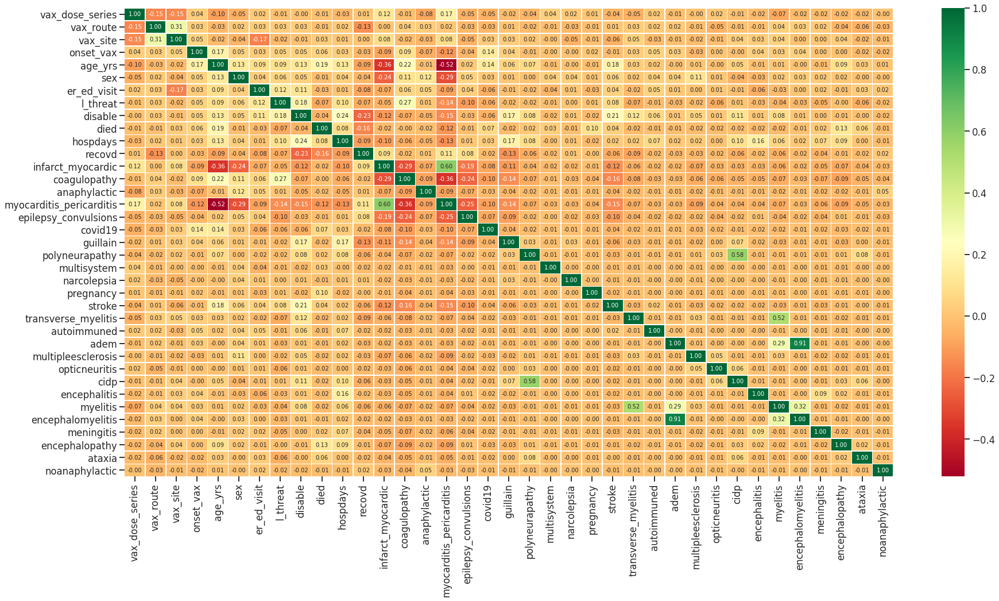

In [105]:
#Correlación de variables
corr = data.corr()
sns.heatmap(
    data=corr,
    annot=True,
    fmt='.2f',
    linewidths=.5,
    cmap='RdYlGn',
    xticklabels=corr.columns.values,
    yticklabels=corr.columns.values
)

fig = plt.gcf()
fig.set_size_inches(30, 15)
plt.show()

#**5. ALGORITOMOS MODELAMIENTO**

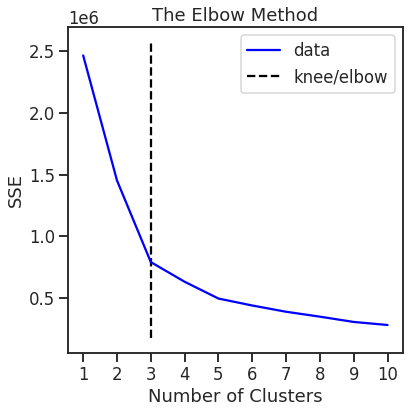

In [106]:
#Choosing the Appropriate Number of Clusters
data_modelamiento=data.copy()
#The elbow method
sse = []

for k in range(1, 11):
   kmeans = KMeans(n_clusters=k, max_iter=300, random_state=42).fit(data_modelamiento)
   sse.append(kmeans.inertia_)

kneedle = KneeLocator(range(1, 11), sse, curve="convex", direction="decreasing")

#plt.plot(range(1, 11), sse)
kneedle.plot_knee()
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.title('The Elbow Method')
plt.show()

In [107]:
kmeans = KMeans(n_clusters=3, max_iter=3000, random_state=42).fit(data_modelamiento)
kmeans.inertia_

791688.1638419554

In [108]:
kmeans.cluster_centers_

array([[1.54032258e+00, 2.00806452e+00, 3.85483871e+00, 8.70725806e+01,
        5.96451613e+01, 4.91935484e-01, 6.20967742e-01, 3.70967742e-01,
        1.45161290e-01, 5.64516129e-02, 4.11290323e+00, 7.90322581e-01,
        8.06451613e-02, 3.95161290e-01, 4.85722573e-17, 1.20967742e-01,
        1.29032258e-01, 1.04838710e-01, 6.45161290e-02, 8.06451613e-03,
        5.20417043e-18, 8.06451613e-03, 8.06451613e-03, 4.83870968e-02,
        1.61290323e-02, 8.06451613e-03, 8.06451613e-03, 1.61290323e-02,
        8.06451613e-03, 1.04083409e-17, 2.41935484e-02, 1.61290323e-02,
        8.06451613e-03, 8.06451613e-03, 3.22580645e-02, 8.67361738e-18,
        6.93889390e-18],
       [1.41009743e+00, 1.81488043e+00, 3.51727192e+00, 1.00726306e+01,
        6.74233835e+01, 5.03985828e-01, 6.03188663e-01, 3.22409212e-01,
        1.47918512e-01, 6.55447298e-02, 4.81045173e+00, 7.47564216e-01,
        6.64304694e-02, 3.77325066e-01, 2.39149690e-02, 6.90876882e-02,
        1.76262179e-01, 4.42869796e-02,

In [109]:
# The number of iterations required to converge
kmeans.n_iter_

7

##**5.2. EVALUACIÓN DE VARIABLES QUE AUMENTAN LOS DÍAS DE HOSPITALIZACIÓN**

age_yrs vs vax_dose_series vs hospdays


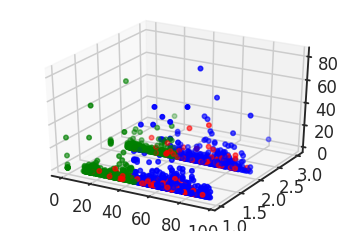

age_yrs vs vax_site vs hospdays


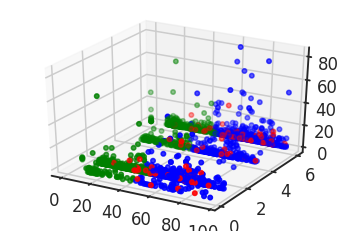

age_yrs vs age_yrs vs hospdays


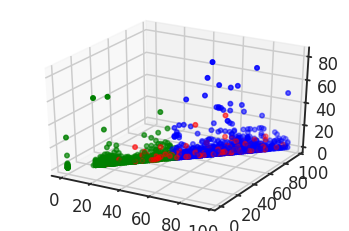

age_yrs vs er_ed_visit vs hospdays


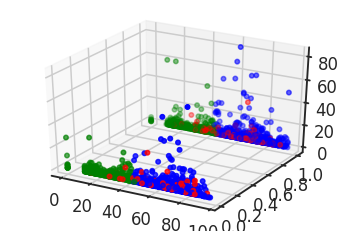

age_yrs vs disable vs hospdays


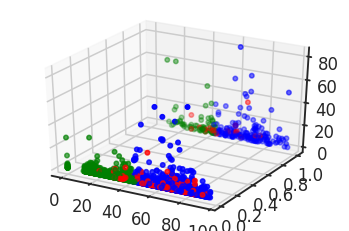

age_yrs vs hospdays vs hospdays


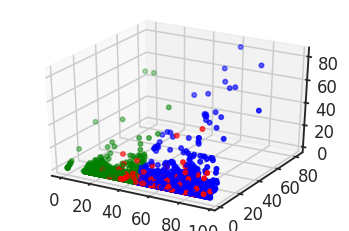

age_yrs vs infarct_myocardic vs hospdays


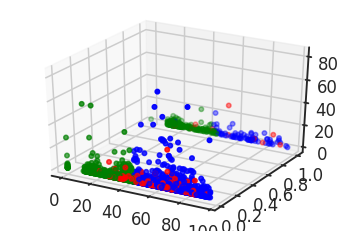

age_yrs vs anaphylactic vs hospdays


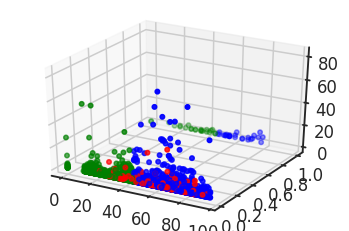

age_yrs vs epilepsy_convulsions vs hospdays


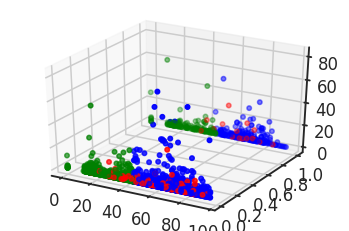

age_yrs vs guillain vs hospdays


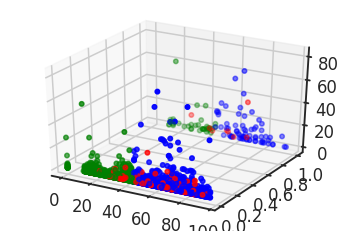

age_yrs vs multisystem vs hospdays


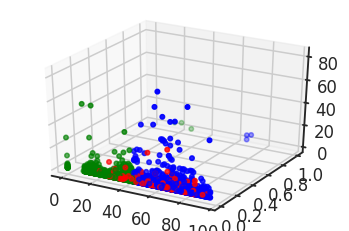

age_yrs vs pregnancy vs hospdays


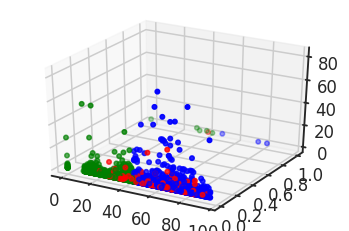

age_yrs vs transverse_myelitis vs hospdays


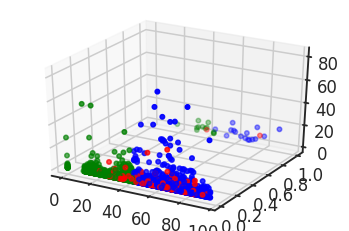

age_yrs vs adem vs hospdays


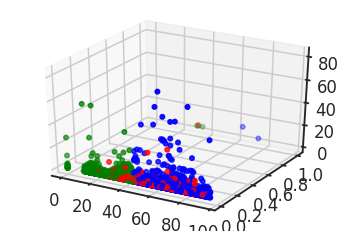

age_yrs vs opticneuritis vs hospdays


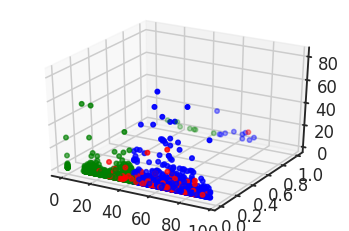

age_yrs vs encephalitis vs hospdays


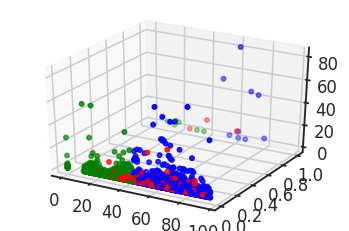

age_yrs vs encephalomyelitis vs hospdays


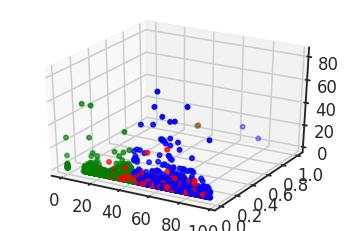

age_yrs vs encephalopathy vs hospdays


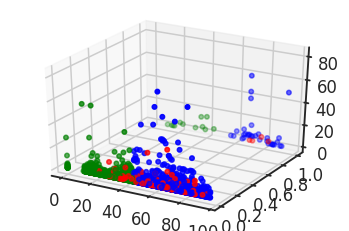

age_yrs vs noanaphylactic vs hospdays


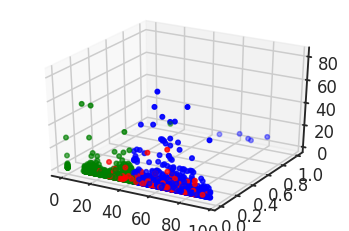

In [110]:
### OBSERVAR QUE VARIABLES SON LAS QUE AUMENTAN LA CANTIDAD DE DÍAS DE HOSPITALIZACIÓN.
colormap = np.array(['Red', 'Blue', 'Green'])
variables=list(data_modelamiento.columns)
for element in variables :
  print('age_yrs'+" vs "+element+ " vs "+'hospdays')
  fig = plt.figure()
  ax = plt.axes(projection='3d')
  ax.scatter3D(data_modelamiento['age_yrs'], data_modelamiento[element],data_modelamiento['hospdays'], c=colormap[kmeans.labels_]);
  plt.show()
  variables.remove(element)

##**5.3. ELIMINACIÓN DE VARIABLES NO INFORMATIVAS POR K-MEANS :**


In [112]:
data_modelamiento.drop(['anaphylactic','myocarditis_pericarditis', 'polyneurapathy',
                        'multisystem','narcolepsia','pregnancy', 'autoimmuned', 
                        'multipleesclerosis','opticneuritis','cidp', 'encephalitis', 
                        'myelitis', 'meningitis', 'encephalopathy', 'ataxia', 
                        'noanaphylactic'],axis=1,inplace=True)

age_yrs vs vax_dose_series vs hospdays


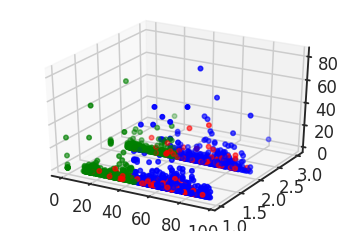

age_yrs vs vax_site vs hospdays


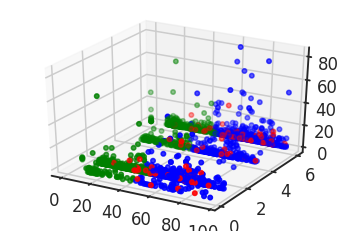

age_yrs vs age_yrs vs hospdays


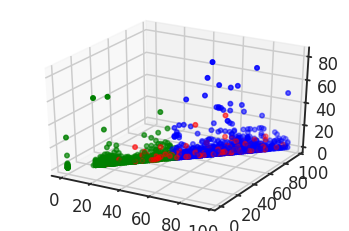

age_yrs vs er_ed_visit vs hospdays


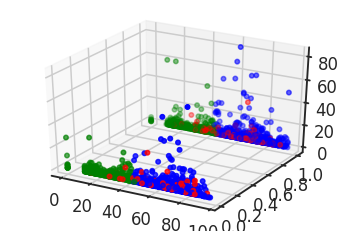

age_yrs vs disable vs hospdays


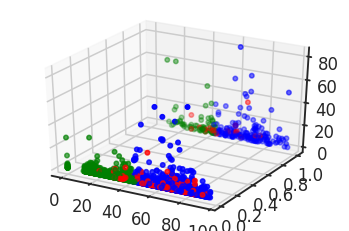

age_yrs vs hospdays vs hospdays


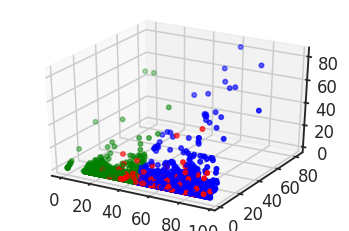

age_yrs vs infarct_myocardic vs hospdays


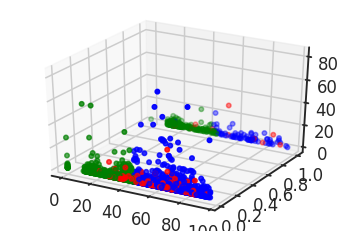

age_yrs vs epilepsy_convulsions vs hospdays


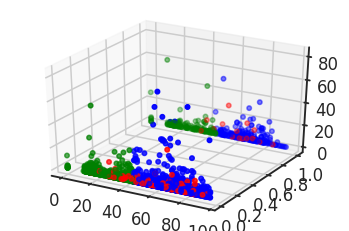

age_yrs vs guillain vs hospdays


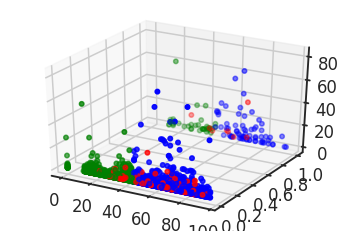

age_yrs vs transverse_myelitis vs hospdays


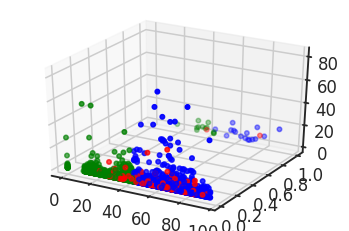

age_yrs vs encephalomyelitis vs hospdays


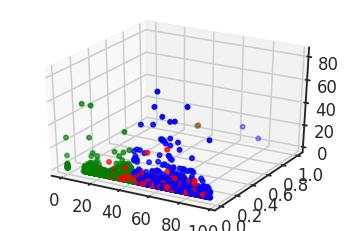

In [114]:
### OBSERVAR QUE VARIABLES SON LAS QUE AUMENTAN LA CANTIDAD DE DÍAS DE HOSPITALIZACIÓN.
colormap = np.array(['Red', 'Blue', 'Green'])
variables=list(data_modelamiento.columns)
for element in variables :
  print('age_yrs'+" vs "+element+ " vs "+'hospdays')
  fig = plt.figure()
  ax = plt.axes(projection='3d')
  ax.scatter3D(data_modelamiento['age_yrs'], data_modelamiento[element],data_modelamiento['hospdays'], c=colormap[kmeans.labels_]);
  plt.show()
  variables.remove(element)

##**5.4. COMPROBACIÓN DE MODELADO (volviendo a hacer el KMEANS Y APLICANDO DENDOGRMA)**

In [116]:
data_modelamiento.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2210 entries, 0 to 2209
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype
---  ------                --------------  -----
 0   vax_dose_series       2210 non-null   int64
 1   vax_route             2210 non-null   int64
 2   vax_site              2210 non-null   int64
 3   onset_vax             2210 non-null   int64
 4   age_yrs               2210 non-null   int64
 5   sex                   2210 non-null   int64
 6   er_ed_visit           2210 non-null   int64
 7   l_threat              2210 non-null   int64
 8   disable               2210 non-null   int64
 9   died                  2210 non-null   int64
 10  hospdays              2210 non-null   int64
 11  recovd                2210 non-null   int64
 12  infarct_myocardic     2210 non-null   int64
 13  coagulopathy          2210 non-null   int64
 14  epilepsy_convulsions  2210 non-null   int64
 15  covid19               2210 non-null   int64
 16  guilla

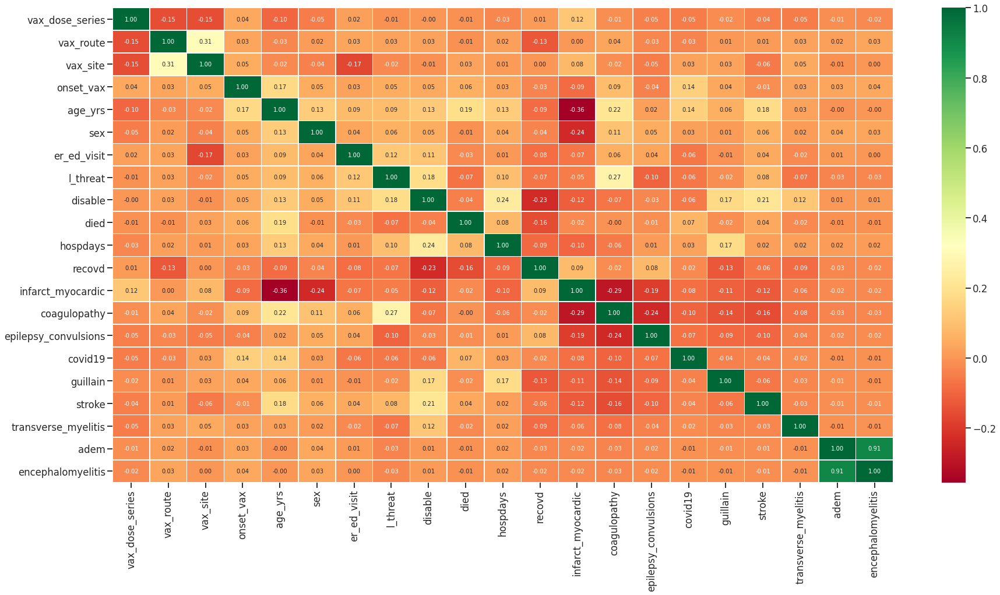

In [117]:
#Correlación de variables
corr = data_modelamiento.corr()
sns.heatmap(
    data=corr,
    annot=True,
    fmt='.2f',
    linewidths=.5,
    cmap='RdYlGn',
    xticklabels=corr.columns.values,
    yticklabels=corr.columns.values
)

fig = plt.gcf()
fig.set_size_inches(30, 15)
plt.show()

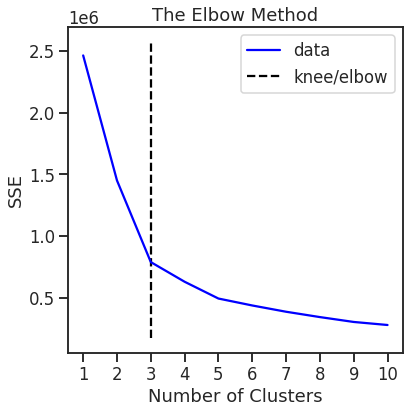

In [119]:
#Choosing the Appropriate Number of Clusters

#The elbow method
sse = []

for k in range(1, 11):
   kmeans = KMeans(n_clusters=k, max_iter=300, random_state=42).fit(data_modelamiento)
   sse.append(kmeans.inertia_)

kneedle = KneeLocator(range(1, 11), sse, curve="convex", direction="decreasing")

#plt.plot(range(1, 11), sse)
kneedle.plot_knee()
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.title('The Elbow Method')
plt.show()

In [120]:
kmeans = KMeans(n_clusters=3, max_iter=3000, random_state=42).fit(data_modelamiento)
kmeans.inertia_

791050.9277948913

In [121]:
kmeans.cluster_centers_

array([[1.52892562e+00, 1.99173554e+00, 3.90082645e+00, 8.79834711e+01,
        5.91983471e+01, 5.04132231e-01, 6.11570248e-01, 3.63636364e-01,
        1.48760331e-01, 5.78512397e-02, 4.14876033e+00, 8.09917355e-01,
        8.26446281e-02, 3.88429752e-01, 1.32231405e-01, 1.07438017e-01,
        6.61157025e-02, 4.95867769e-02, 1.65289256e-02, 8.26446281e-03,
        8.26446281e-03],
       [1.41202476e+00, 1.81874447e+00, 3.51105217e+00, 1.01874447e+01,
        6.74694960e+01, 5.03094607e-01, 6.03890363e-01, 3.22723254e-01,
        1.46772767e-01, 6.54288240e-02, 4.78426172e+00, 7.46242263e-01,
        6.63129973e-02, 3.78426172e-01, 1.75950486e-01, 4.42086649e-02,
        6.10079576e-02, 1.03448276e-01, 1.41467728e-02, 1.76834660e-03,
        1.76834660e-03],
       [1.49791232e+00, 1.87578288e+00, 3.61064718e+00, 6.39039666e+00,
        2.52317328e+01, 4.00835073e-01, 5.12526096e-01, 2.52609603e-01,
        7.62004175e-02, 7.30688935e-03, 3.08141962e+00, 9.00835073e-01,
        3.2881

In [122]:
# The number of iterations required to converge
kmeans.n_iter_

7

vax_dose_series vs vax_route


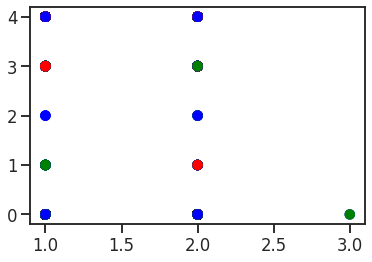

vax_dose_series vs vax_site


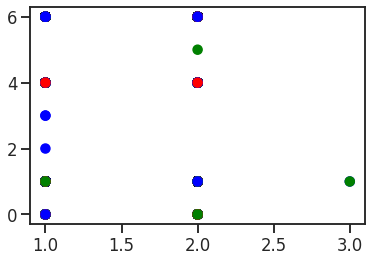

vax_dose_series vs onset_vax


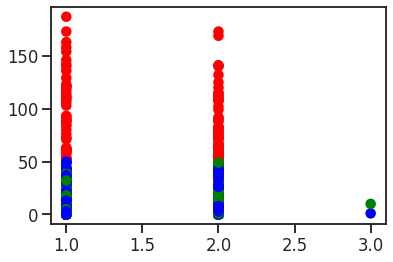

vax_dose_series vs age_yrs


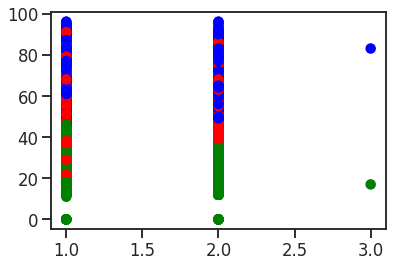

vax_dose_series vs sex


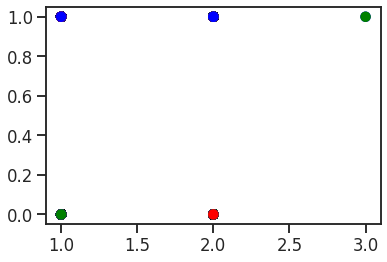

vax_dose_series vs er_ed_visit


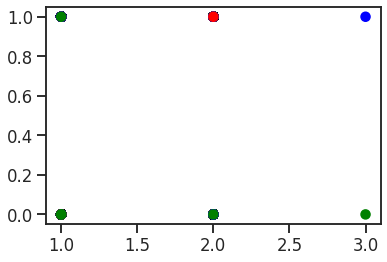

vax_dose_series vs l_threat


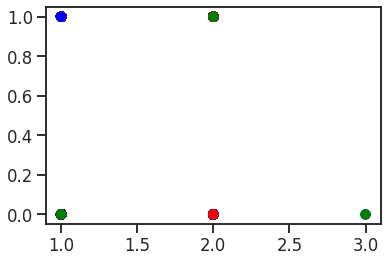

vax_dose_series vs disable


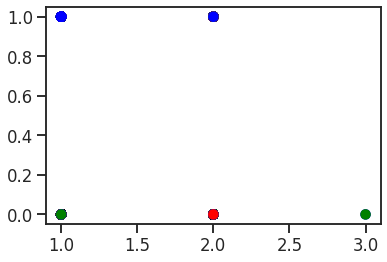

vax_dose_series vs died


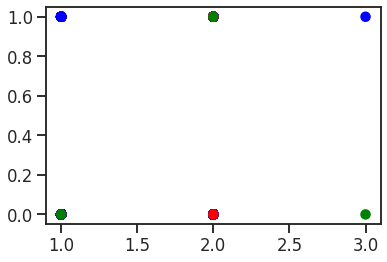

vax_dose_series vs hospdays


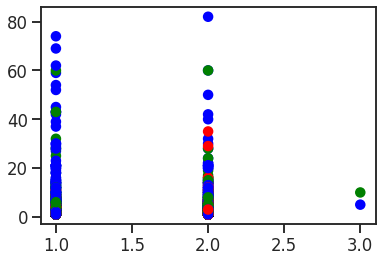

vax_dose_series vs recovd


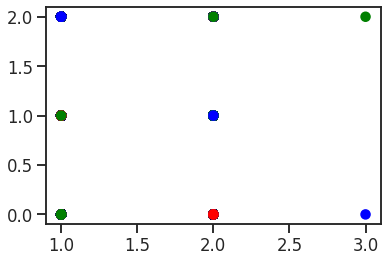

vax_dose_series vs infarct_myocardic


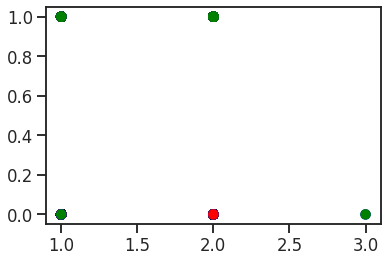

vax_dose_series vs coagulopathy


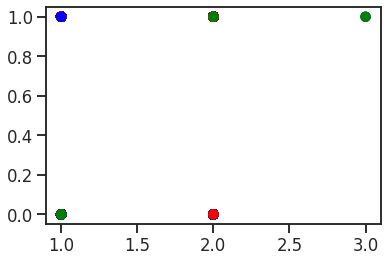

vax_dose_series vs epilepsy_convulsions


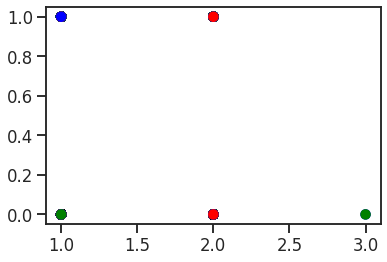

vax_dose_series vs covid19


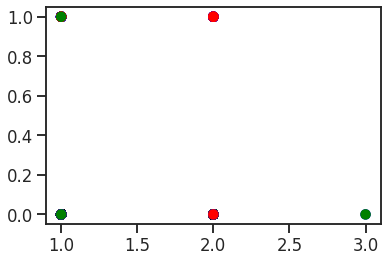

vax_dose_series vs guillain


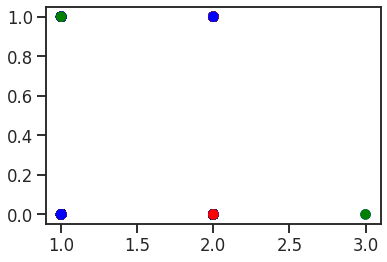

vax_dose_series vs stroke


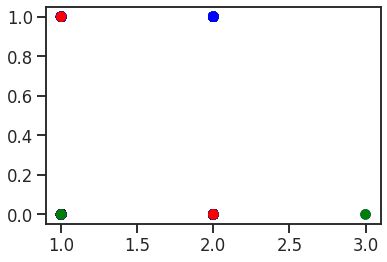

vax_dose_series vs transverse_myelitis


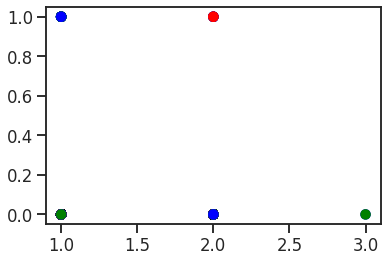

vax_dose_series vs adem


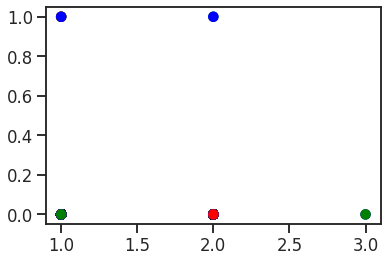

vax_dose_series vs encephalomyelitis


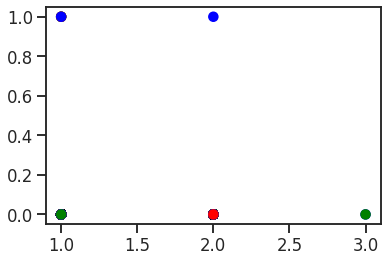

vax_site vs vax_route


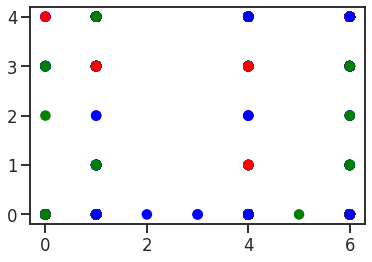

vax_site vs onset_vax


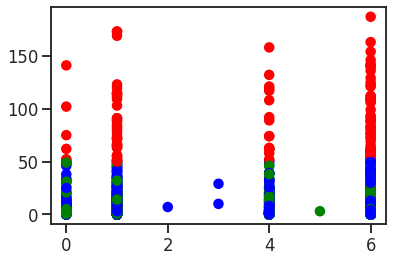

vax_site vs age_yrs


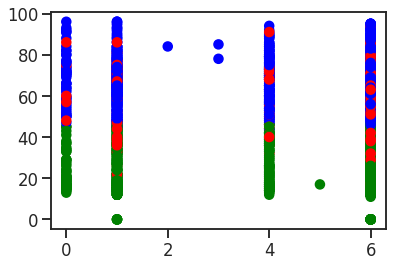

vax_site vs sex


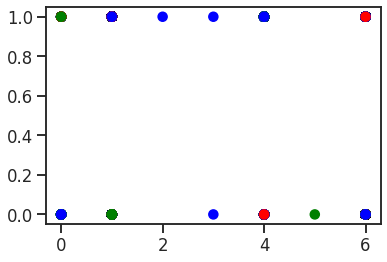

vax_site vs er_ed_visit


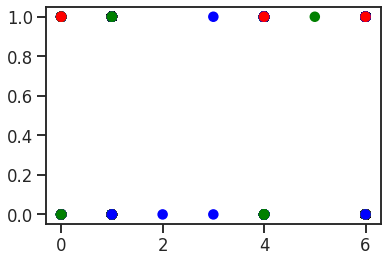

vax_site vs l_threat


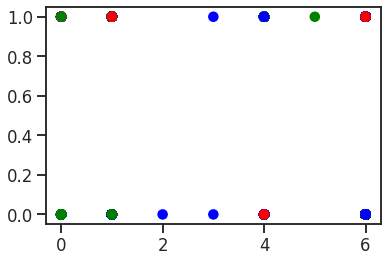

vax_site vs disable


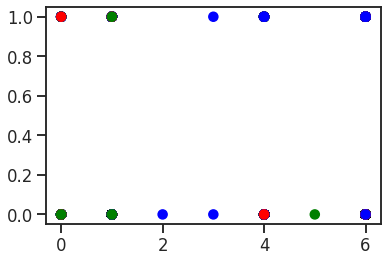

vax_site vs died


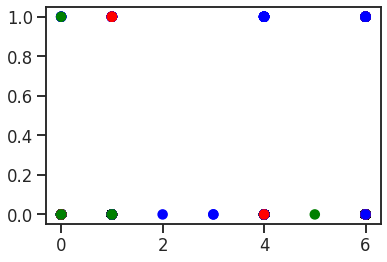

vax_site vs hospdays


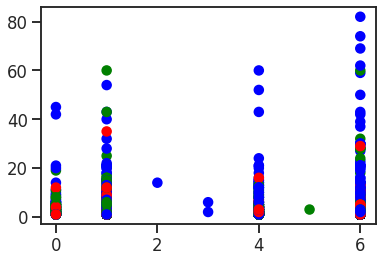

vax_site vs recovd


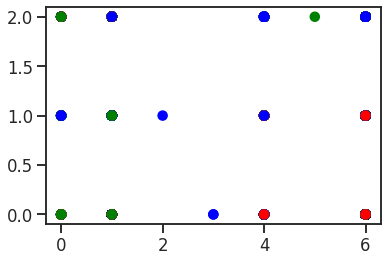

vax_site vs infarct_myocardic


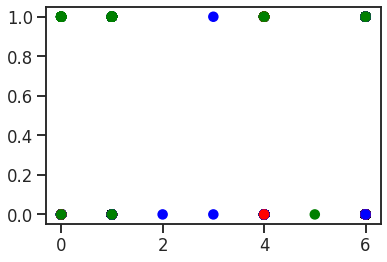

vax_site vs coagulopathy


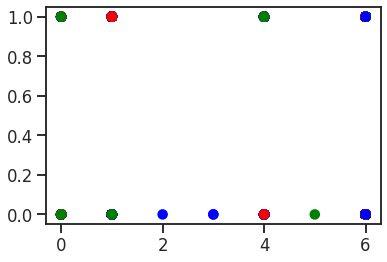

vax_site vs epilepsy_convulsions


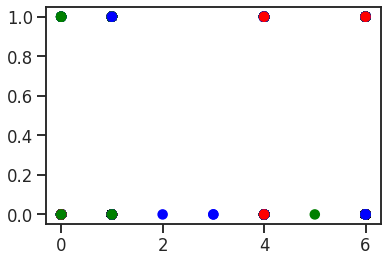

vax_site vs covid19


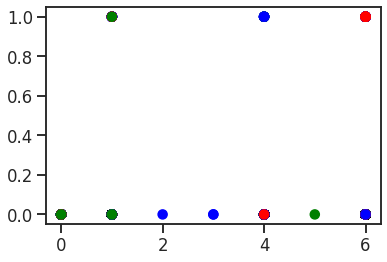

vax_site vs guillain


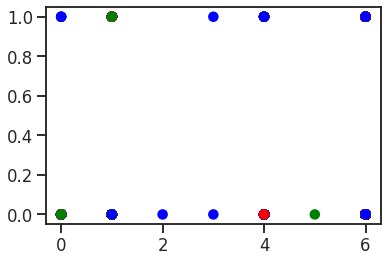

vax_site vs stroke


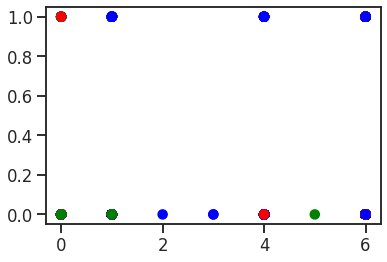

vax_site vs transverse_myelitis


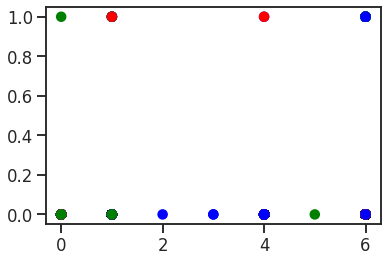

vax_site vs adem


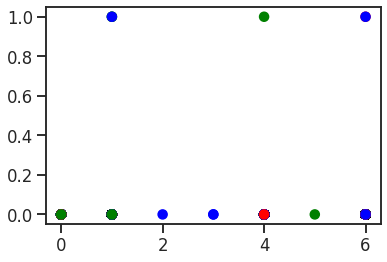

vax_site vs encephalomyelitis


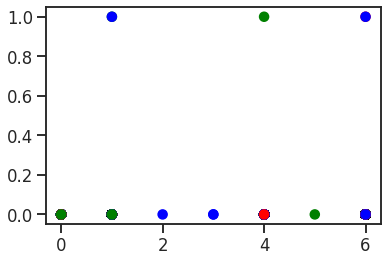

age_yrs vs vax_route


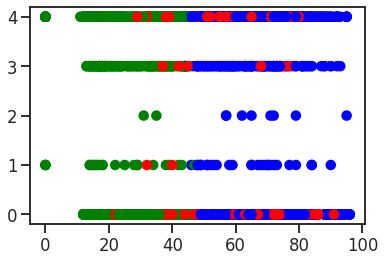

age_yrs vs onset_vax


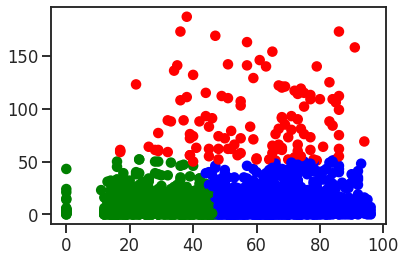

age_yrs vs sex


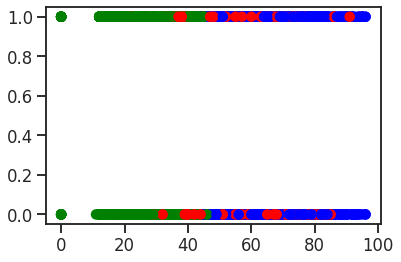

age_yrs vs er_ed_visit


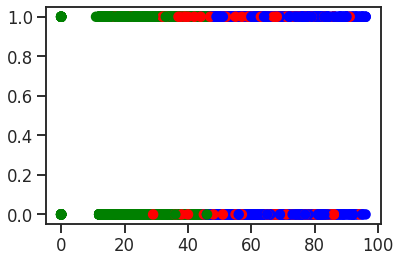

age_yrs vs l_threat


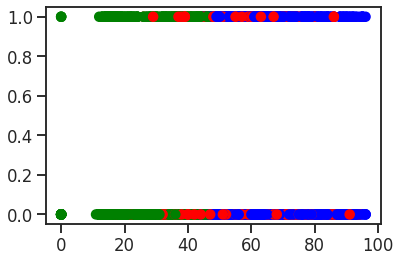

age_yrs vs disable


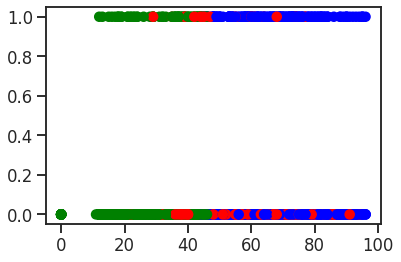

age_yrs vs died


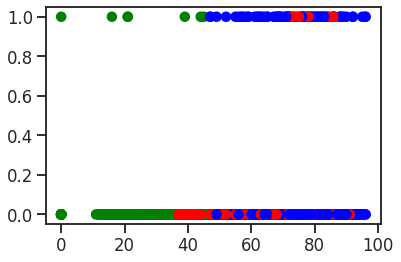

age_yrs vs hospdays


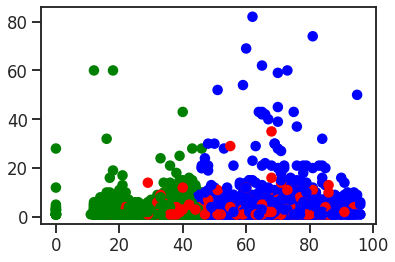

age_yrs vs recovd


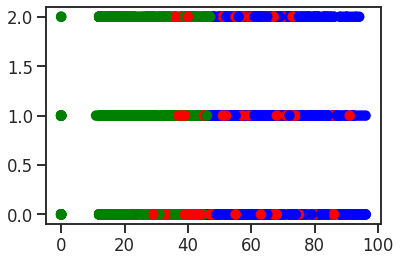

age_yrs vs infarct_myocardic


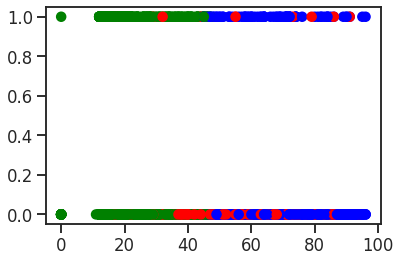

age_yrs vs coagulopathy


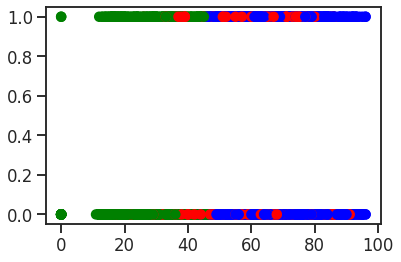

age_yrs vs epilepsy_convulsions


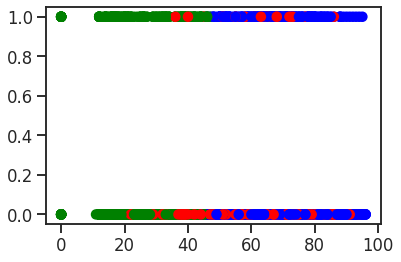

age_yrs vs covid19


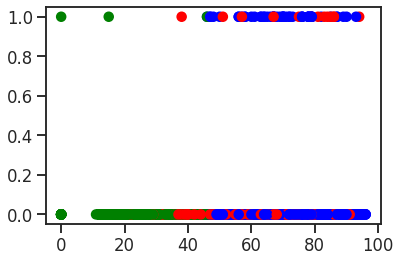

age_yrs vs guillain


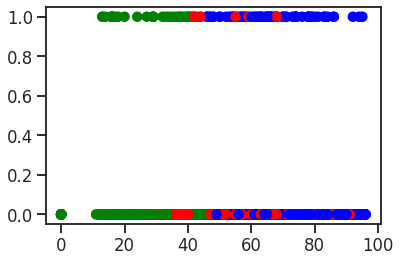

age_yrs vs stroke


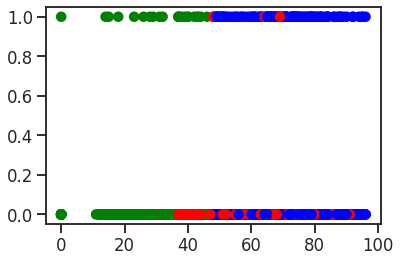

age_yrs vs transverse_myelitis


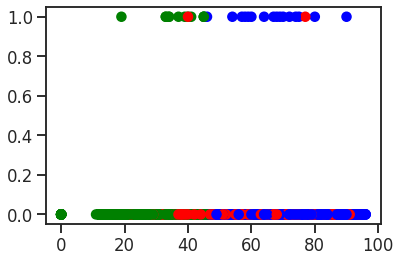

age_yrs vs adem


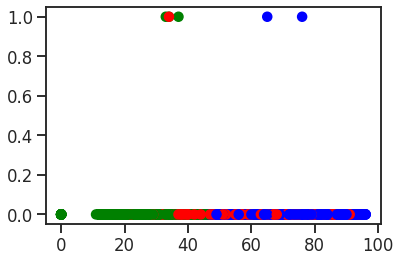

age_yrs vs encephalomyelitis


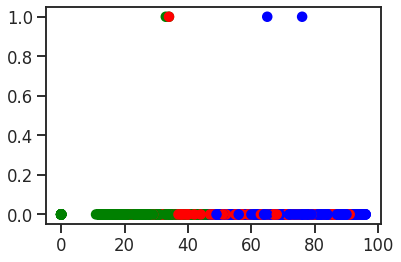

er_ed_visit vs vax_route


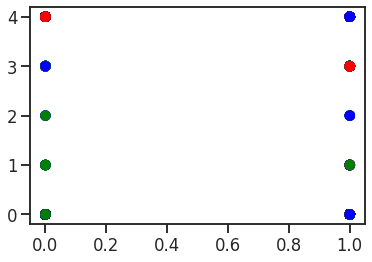

er_ed_visit vs onset_vax


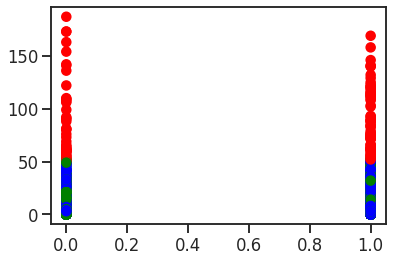

er_ed_visit vs sex


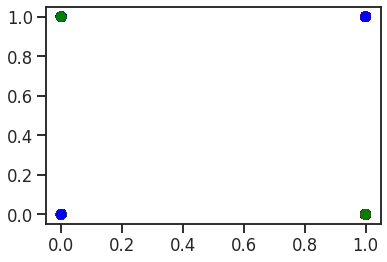

er_ed_visit vs l_threat


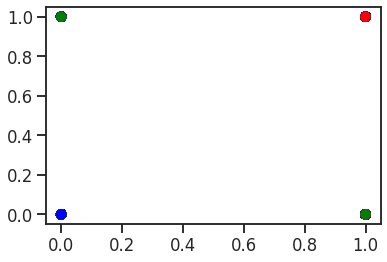

er_ed_visit vs disable


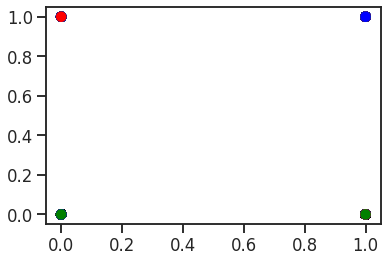

er_ed_visit vs died


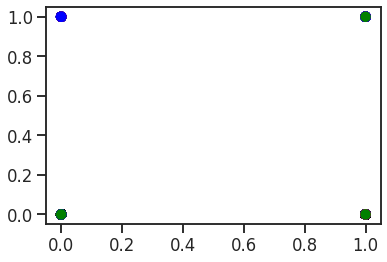

er_ed_visit vs hospdays


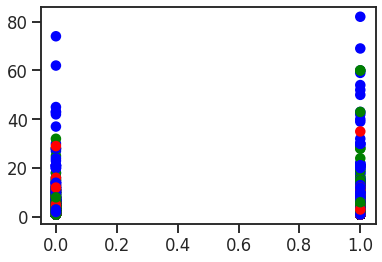

er_ed_visit vs recovd


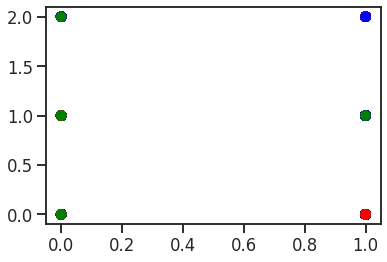

er_ed_visit vs infarct_myocardic


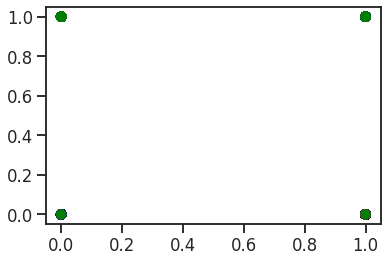

er_ed_visit vs coagulopathy


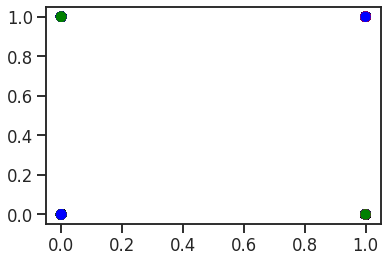

er_ed_visit vs epilepsy_convulsions


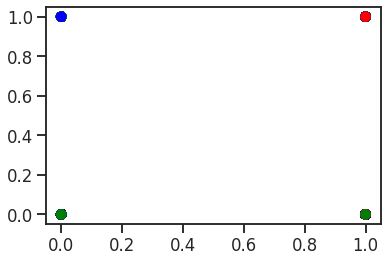

er_ed_visit vs covid19


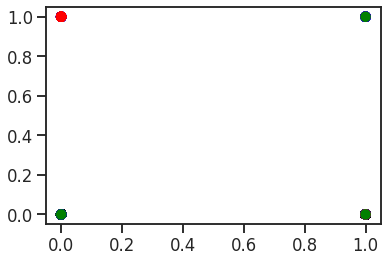

er_ed_visit vs guillain


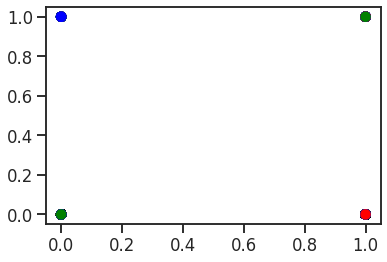

er_ed_visit vs stroke


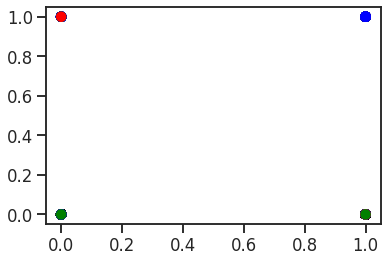

er_ed_visit vs transverse_myelitis


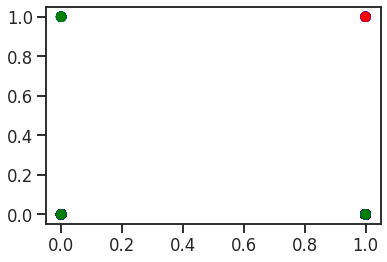

er_ed_visit vs adem


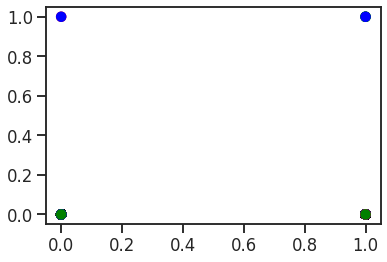

er_ed_visit vs encephalomyelitis


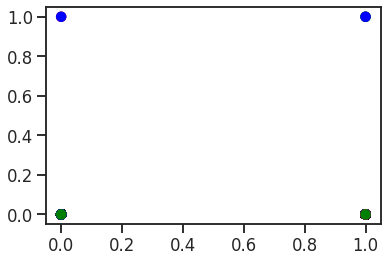

disable vs vax_route


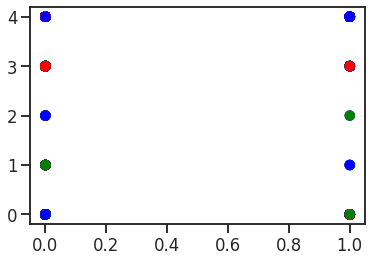

disable vs onset_vax


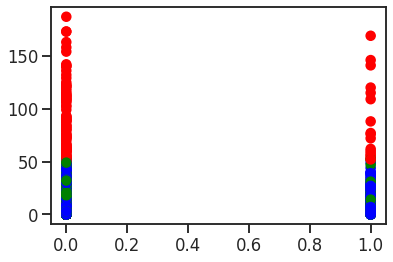

disable vs sex


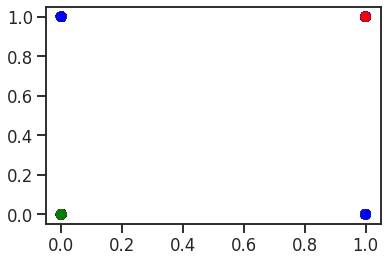

disable vs l_threat


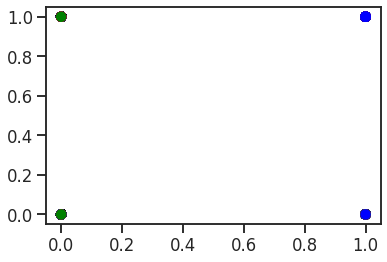

disable vs died


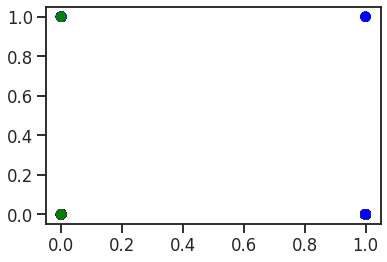

disable vs hospdays


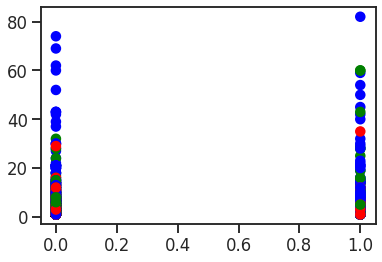

disable vs recovd


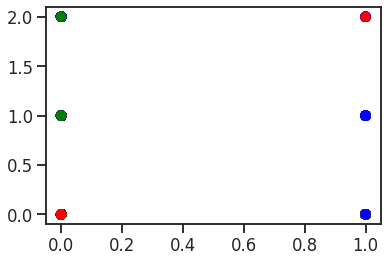

disable vs infarct_myocardic


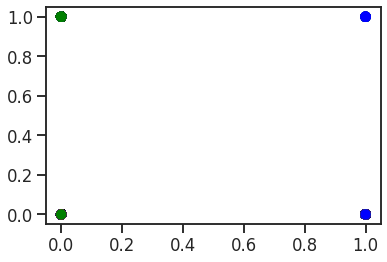

disable vs coagulopathy


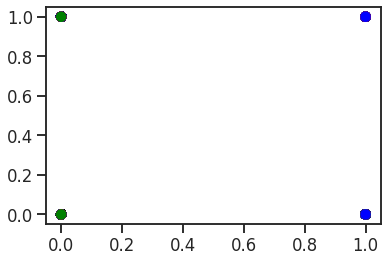

disable vs epilepsy_convulsions


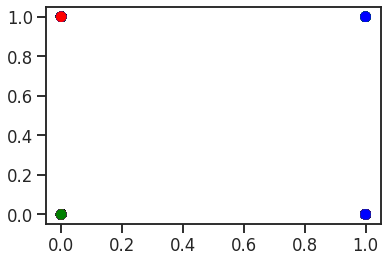

disable vs covid19


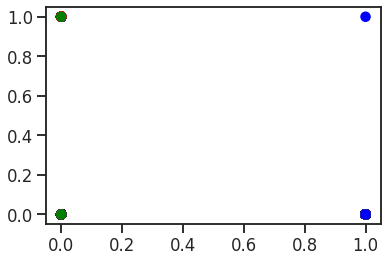

disable vs guillain


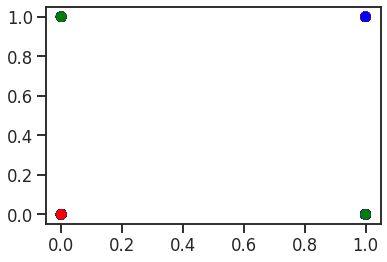

disable vs stroke


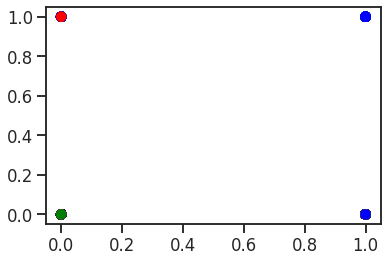

disable vs transverse_myelitis


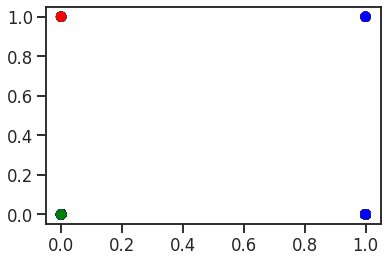

disable vs adem


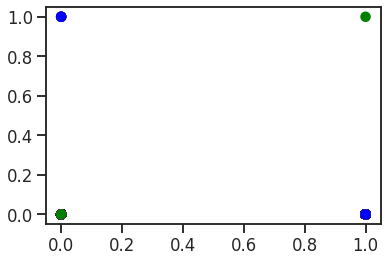

disable vs encephalomyelitis


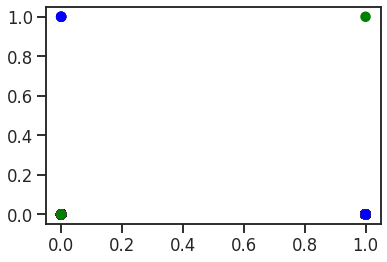

hospdays vs vax_route


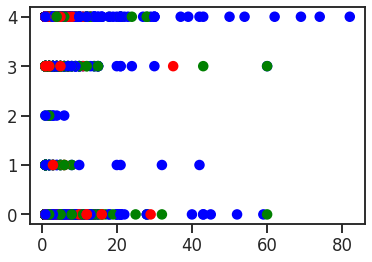

hospdays vs onset_vax


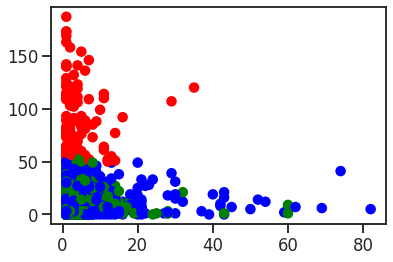

hospdays vs sex


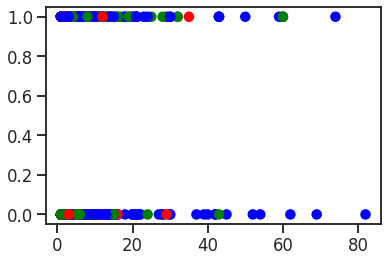

hospdays vs l_threat


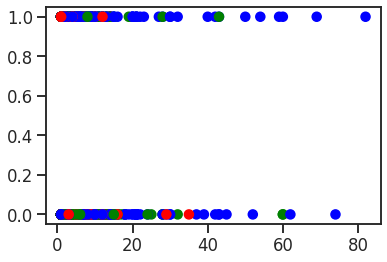

hospdays vs died


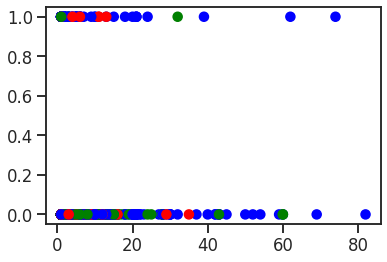

hospdays vs recovd


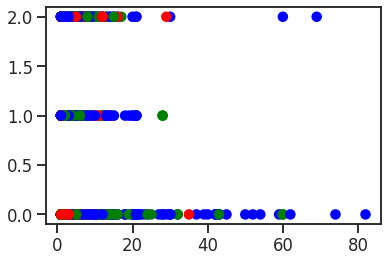

hospdays vs infarct_myocardic


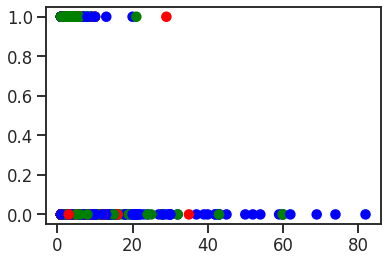

hospdays vs coagulopathy


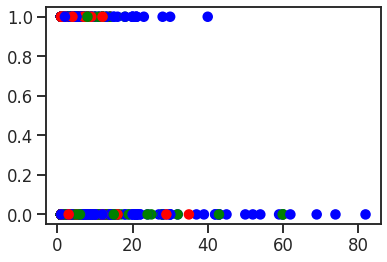

hospdays vs epilepsy_convulsions


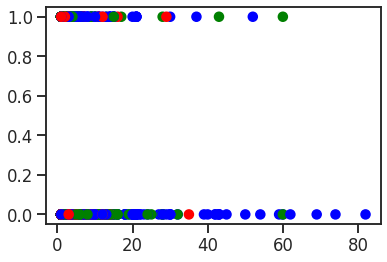

hospdays vs covid19


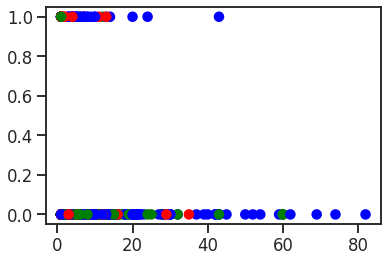

hospdays vs guillain


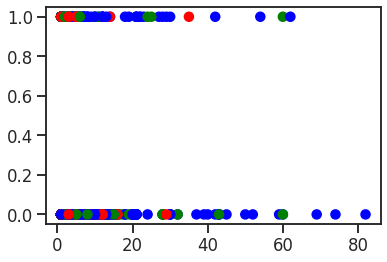

hospdays vs stroke


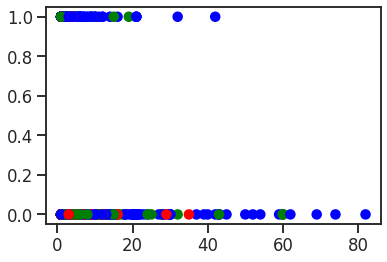

hospdays vs transverse_myelitis


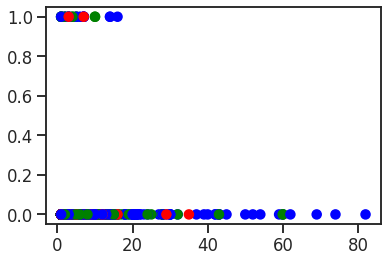

hospdays vs adem


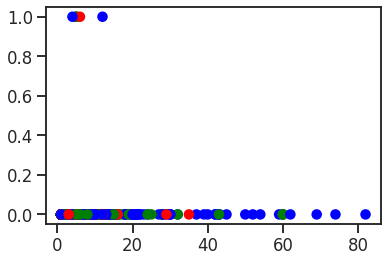

hospdays vs encephalomyelitis


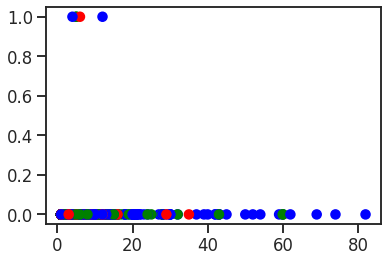

infarct_myocardic vs vax_route


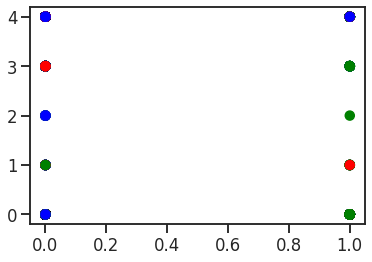

infarct_myocardic vs onset_vax


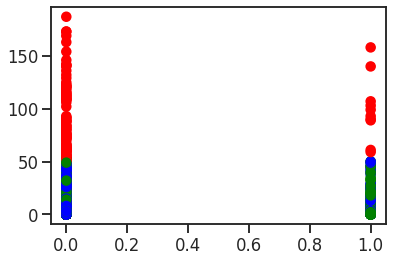

infarct_myocardic vs sex


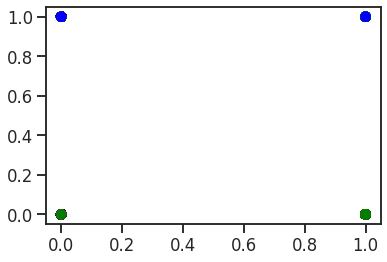

infarct_myocardic vs l_threat


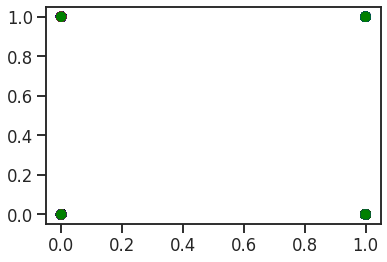

infarct_myocardic vs died


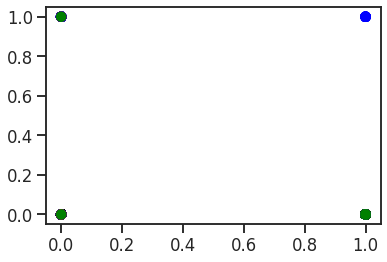

infarct_myocardic vs recovd


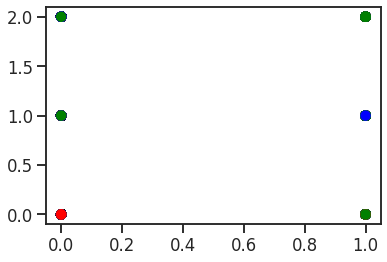

infarct_myocardic vs coagulopathy


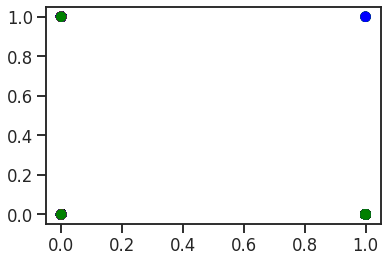

infarct_myocardic vs epilepsy_convulsions


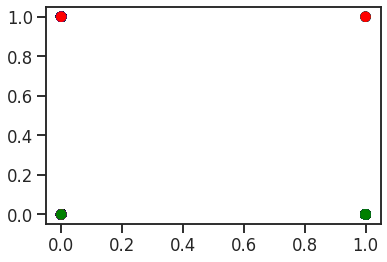

infarct_myocardic vs covid19


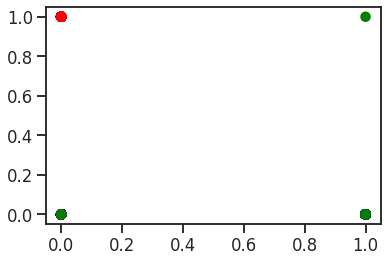

infarct_myocardic vs guillain


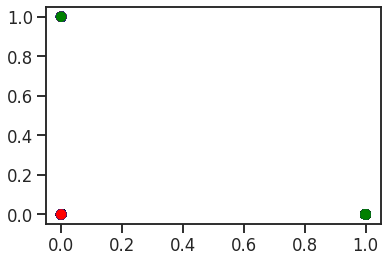

infarct_myocardic vs stroke


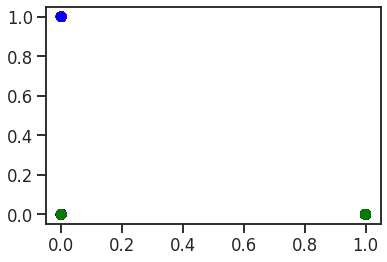

infarct_myocardic vs transverse_myelitis


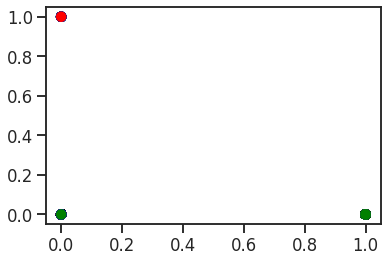

infarct_myocardic vs adem


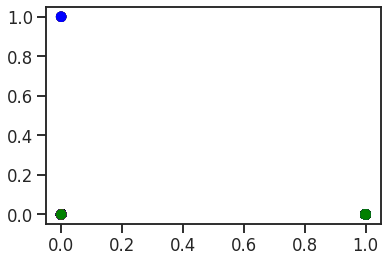

infarct_myocardic vs encephalomyelitis


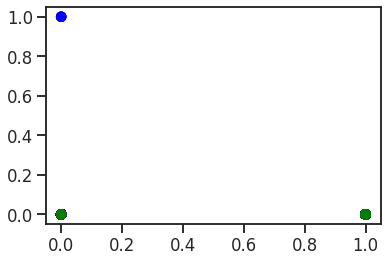

epilepsy_convulsions vs vax_route


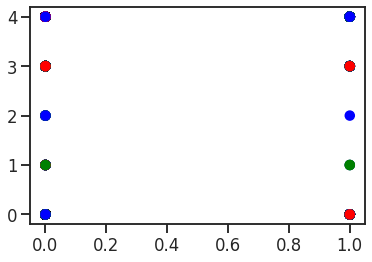

epilepsy_convulsions vs onset_vax


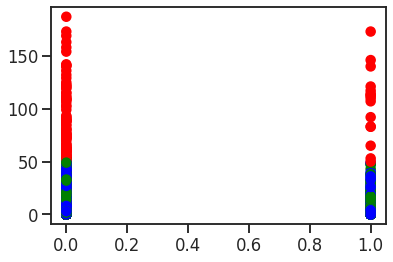

epilepsy_convulsions vs sex


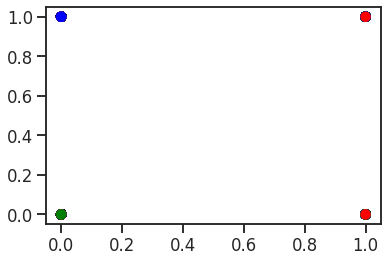

epilepsy_convulsions vs l_threat


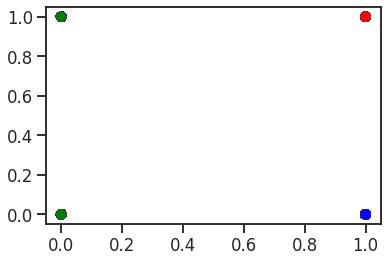

epilepsy_convulsions vs died


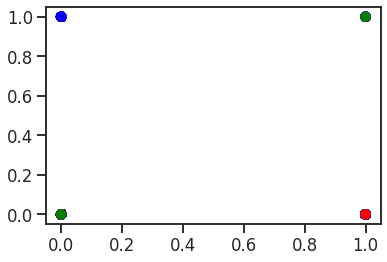

epilepsy_convulsions vs recovd


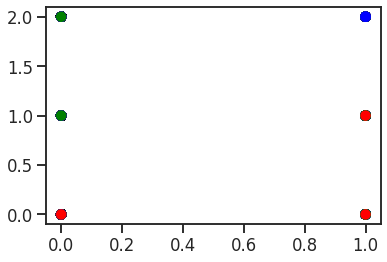

epilepsy_convulsions vs coagulopathy


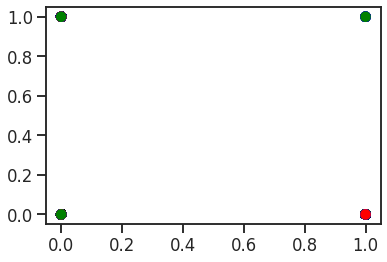

epilepsy_convulsions vs covid19


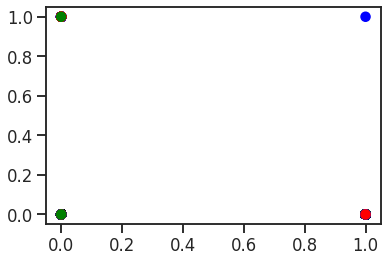

epilepsy_convulsions vs guillain


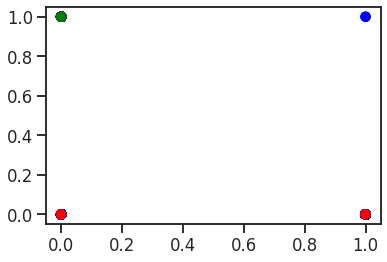

epilepsy_convulsions vs stroke


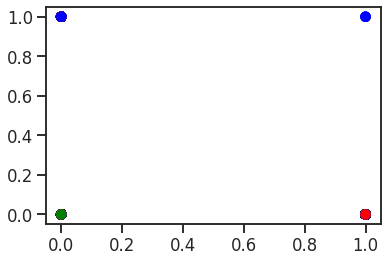

epilepsy_convulsions vs transverse_myelitis


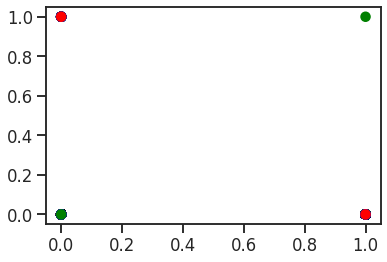

epilepsy_convulsions vs adem


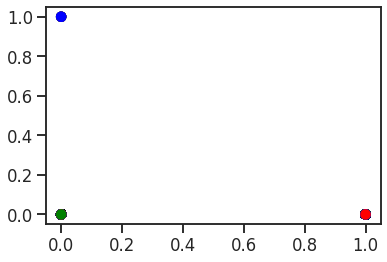

epilepsy_convulsions vs encephalomyelitis


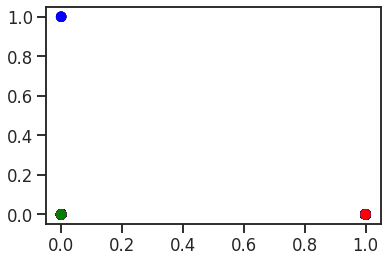

guillain vs vax_route


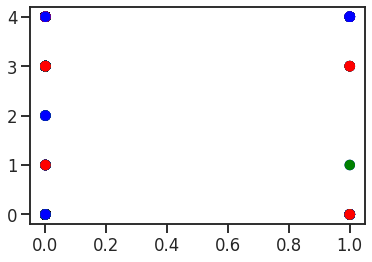

guillain vs onset_vax


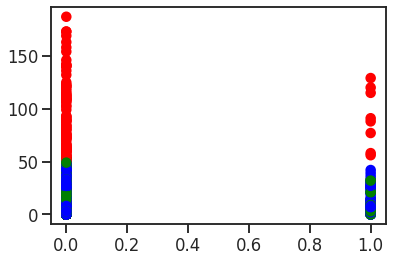

guillain vs sex


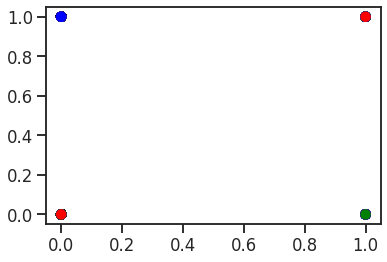

guillain vs l_threat


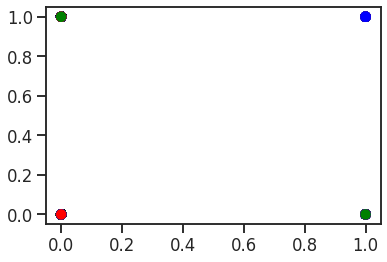

guillain vs died


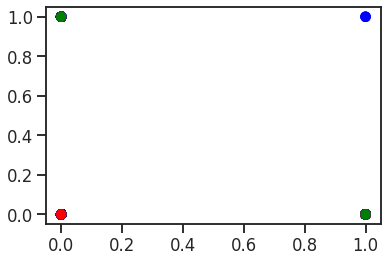

guillain vs recovd


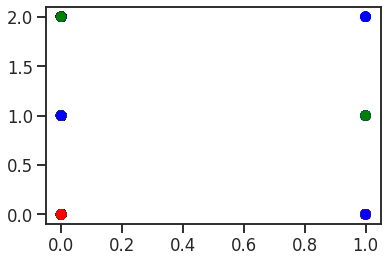

guillain vs coagulopathy


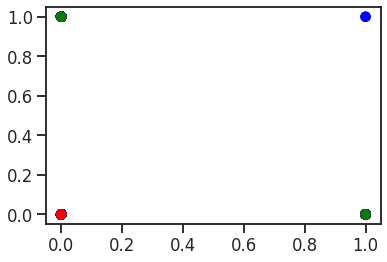

guillain vs covid19


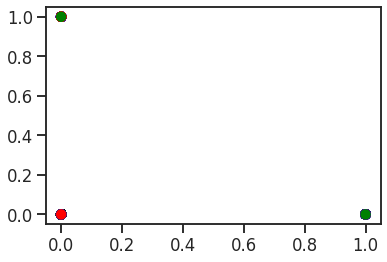

guillain vs stroke


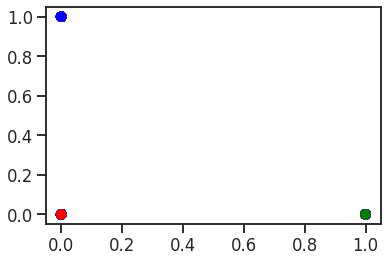

guillain vs transverse_myelitis


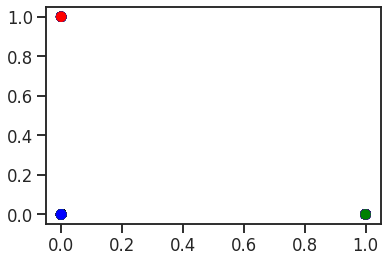

guillain vs adem


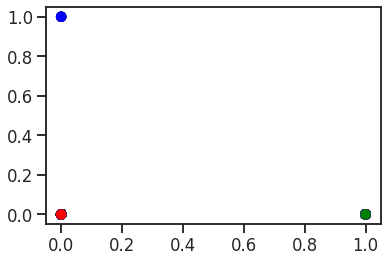

guillain vs encephalomyelitis


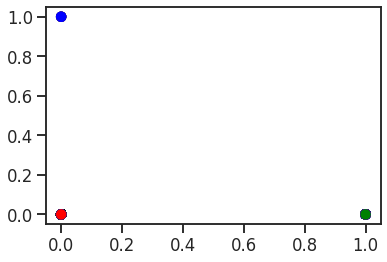

transverse_myelitis vs vax_route


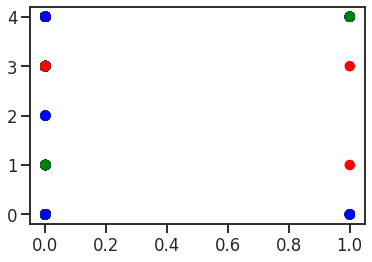

transverse_myelitis vs onset_vax


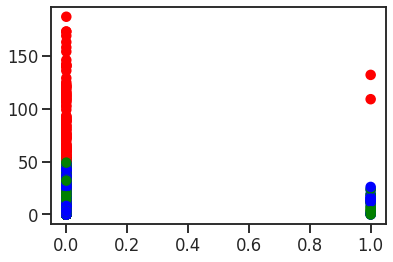

transverse_myelitis vs sex


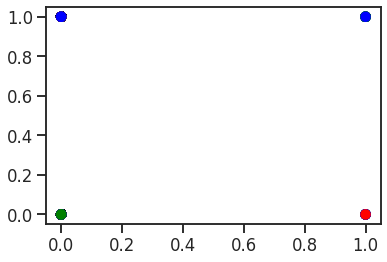

transverse_myelitis vs l_threat


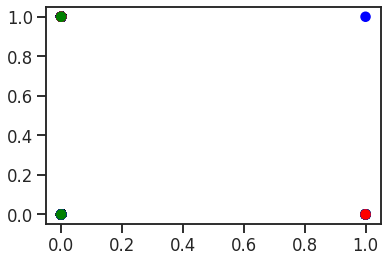

transverse_myelitis vs died


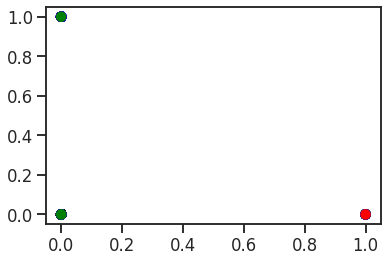

transverse_myelitis vs recovd


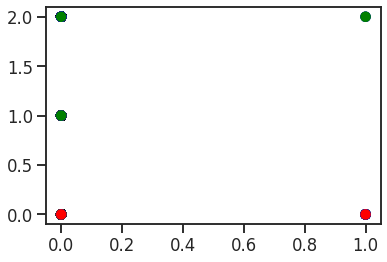

transverse_myelitis vs coagulopathy


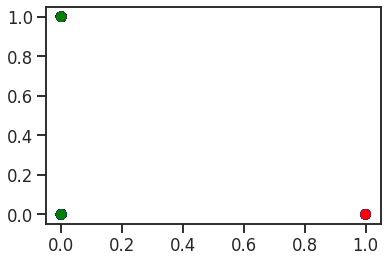

transverse_myelitis vs covid19


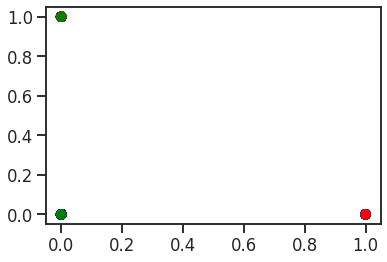

transverse_myelitis vs stroke


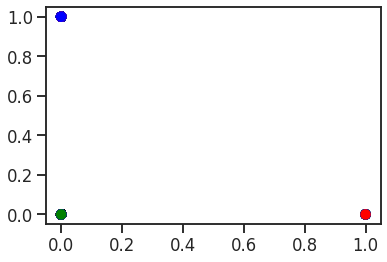

transverse_myelitis vs adem


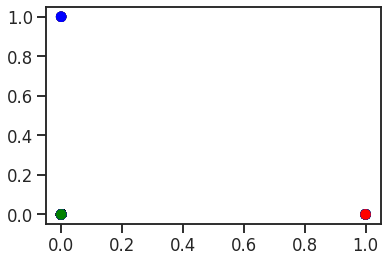

transverse_myelitis vs encephalomyelitis


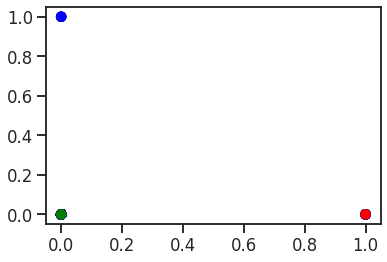

encephalomyelitis vs vax_route


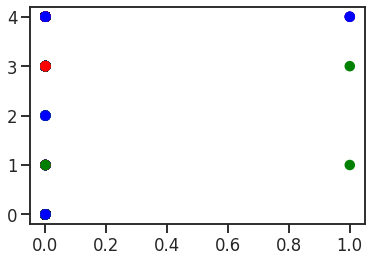

encephalomyelitis vs onset_vax


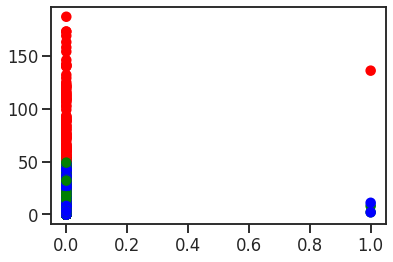

encephalomyelitis vs sex


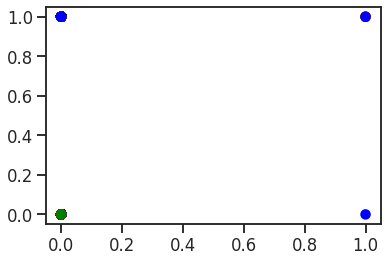

encephalomyelitis vs l_threat


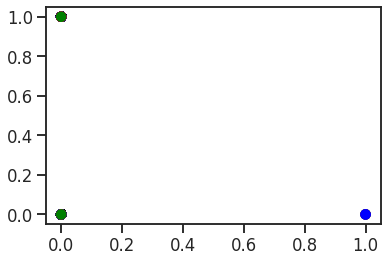

encephalomyelitis vs died


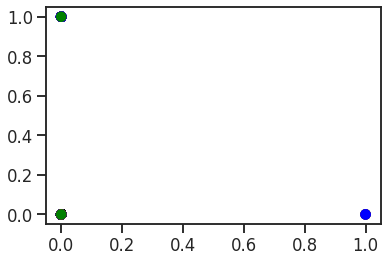

encephalomyelitis vs recovd


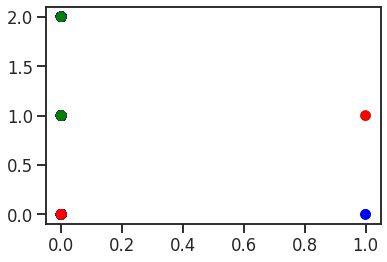

encephalomyelitis vs coagulopathy


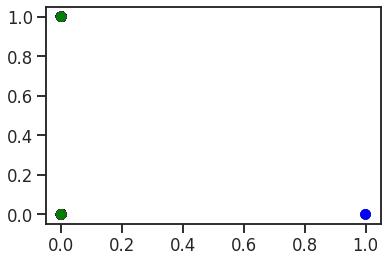

encephalomyelitis vs covid19


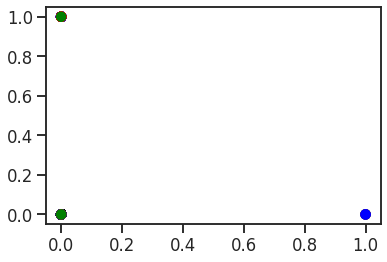

encephalomyelitis vs stroke


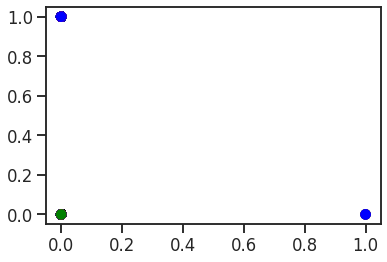

encephalomyelitis vs adem


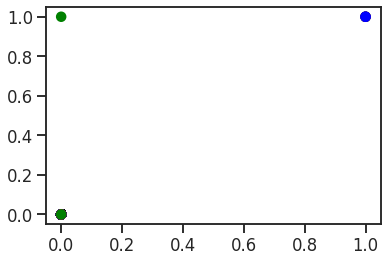

In [123]:
colormap = np.array(['Red', 'Blue', 'Green'])
variables=list(data_modelamiento.columns)
for element in variables:
  variables.remove(element)
  for e in variables :
    print(element+" vs "+e)
    plt.scatter(data_modelamiento[element],data_modelamiento[e], c = colormap[kmeans.labels_])
    plt.show()

age_yrs vs vax_dose_series vs vax_route


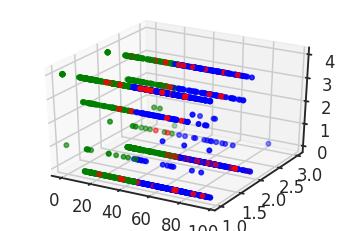

age_yrs vs vax_dose_series vs vax_site


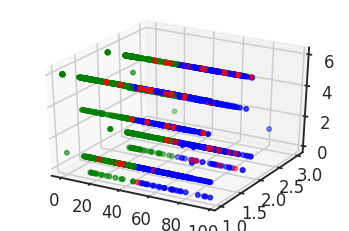

age_yrs vs vax_dose_series vs onset_vax


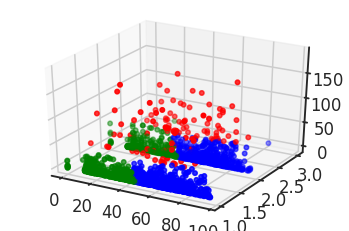

age_yrs vs vax_dose_series vs age_yrs


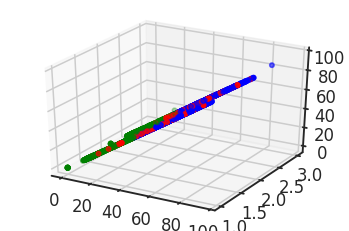

age_yrs vs vax_dose_series vs sex


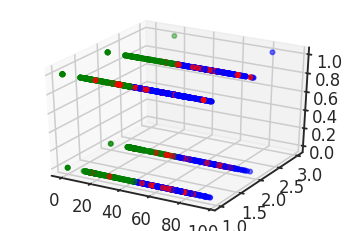

age_yrs vs vax_dose_series vs er_ed_visit


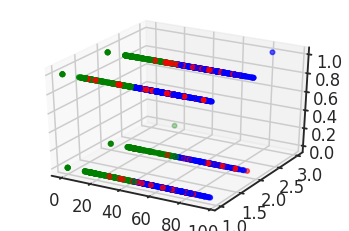

age_yrs vs vax_dose_series vs l_threat


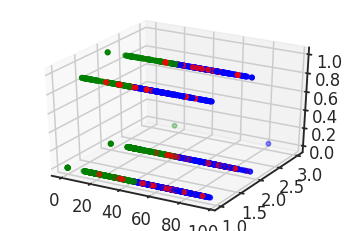

age_yrs vs vax_dose_series vs disable


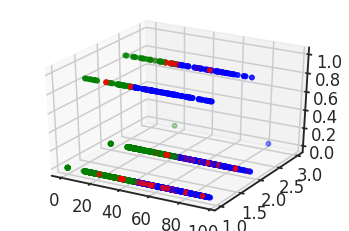

age_yrs vs vax_dose_series vs died


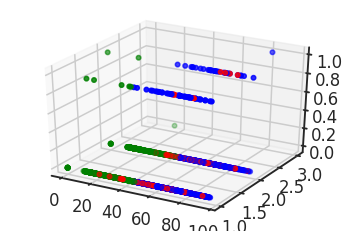

age_yrs vs vax_dose_series vs hospdays


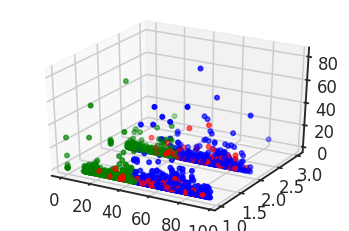

age_yrs vs vax_dose_series vs recovd


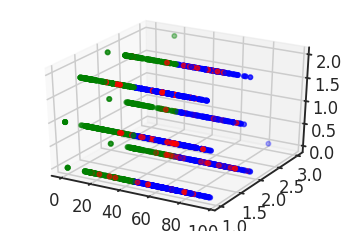

age_yrs vs vax_dose_series vs infarct_myocardic


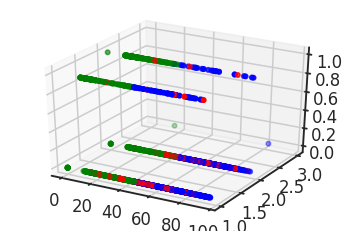

age_yrs vs vax_dose_series vs coagulopathy


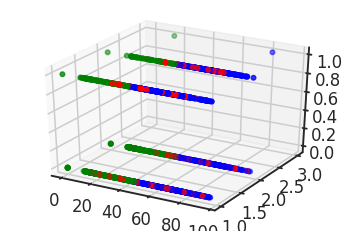

age_yrs vs vax_dose_series vs epilepsy_convulsions


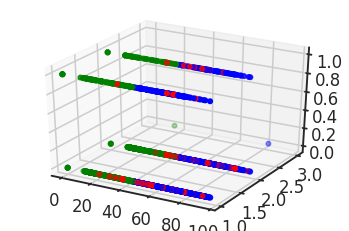

age_yrs vs vax_dose_series vs covid19


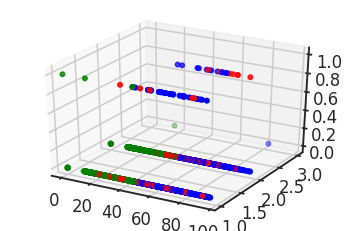

age_yrs vs vax_dose_series vs guillain


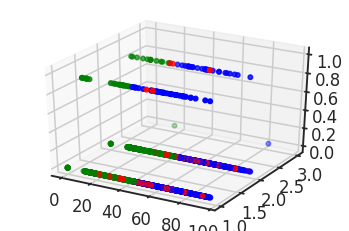

age_yrs vs vax_dose_series vs stroke


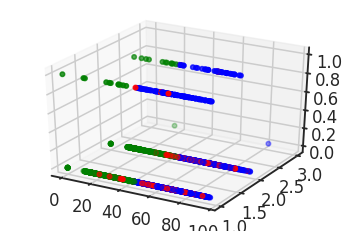

age_yrs vs vax_dose_series vs transverse_myelitis


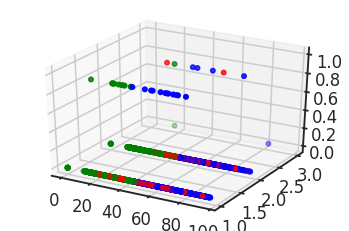

age_yrs vs vax_dose_series vs adem


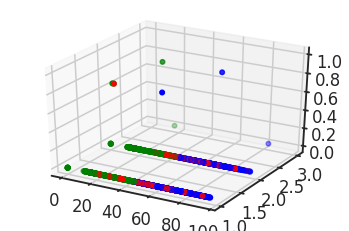

age_yrs vs vax_dose_series vs encephalomyelitis


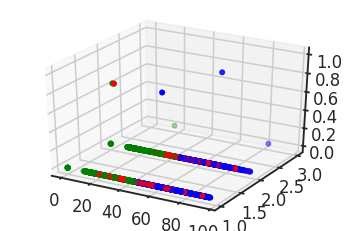

age_yrs vs vax_site vs vax_route


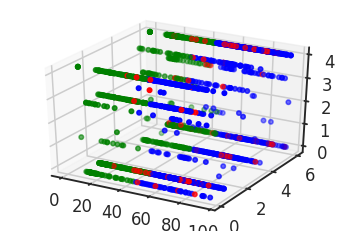

age_yrs vs vax_site vs onset_vax


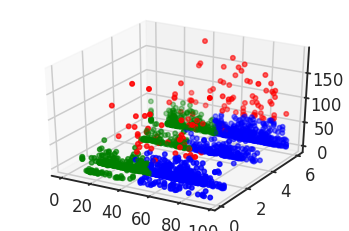

age_yrs vs vax_site vs age_yrs


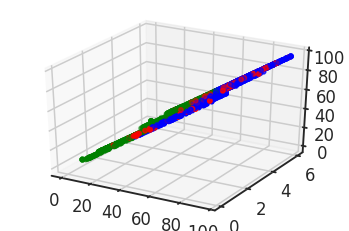

age_yrs vs vax_site vs sex


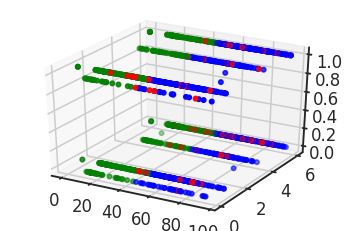

age_yrs vs vax_site vs er_ed_visit


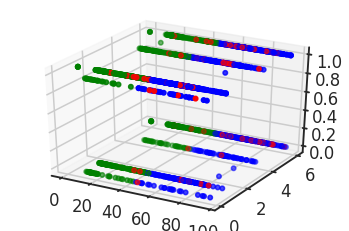

age_yrs vs vax_site vs l_threat


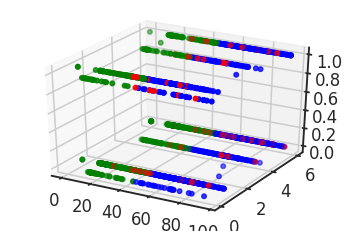

age_yrs vs vax_site vs disable


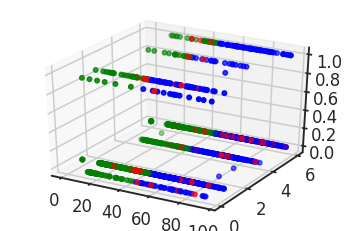

age_yrs vs vax_site vs died


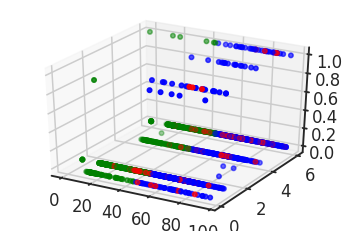

age_yrs vs vax_site vs hospdays


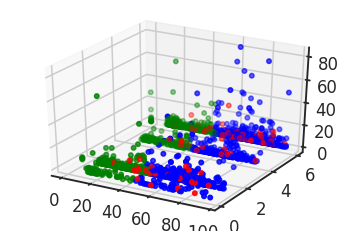

age_yrs vs vax_site vs recovd


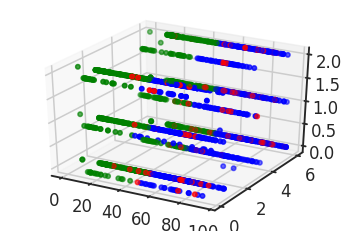

age_yrs vs vax_site vs infarct_myocardic


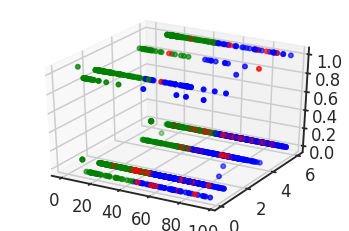

age_yrs vs vax_site vs coagulopathy


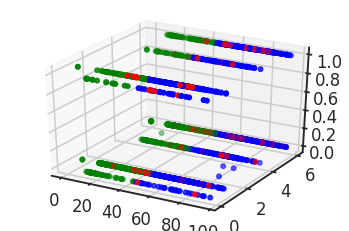

age_yrs vs vax_site vs epilepsy_convulsions


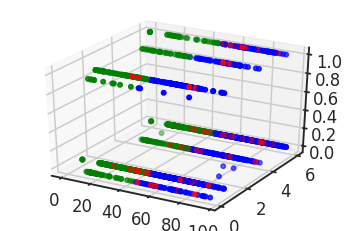

age_yrs vs vax_site vs covid19


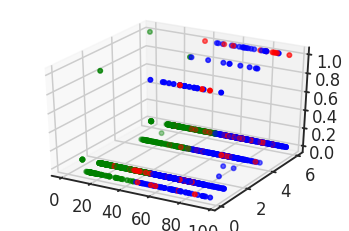

age_yrs vs vax_site vs guillain


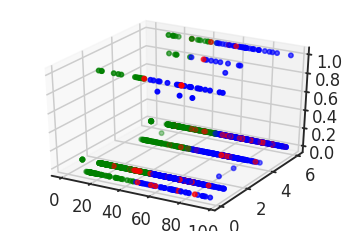

age_yrs vs vax_site vs stroke


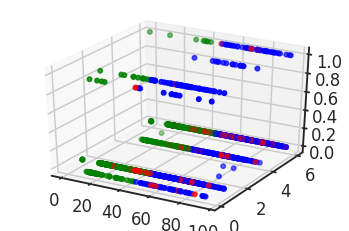

age_yrs vs vax_site vs transverse_myelitis


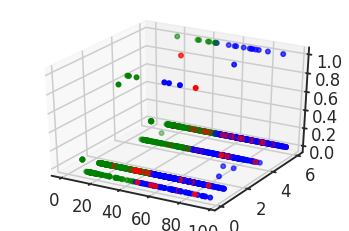

age_yrs vs vax_site vs adem


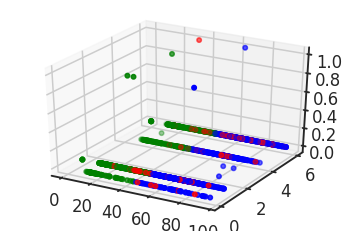

age_yrs vs vax_site vs encephalomyelitis


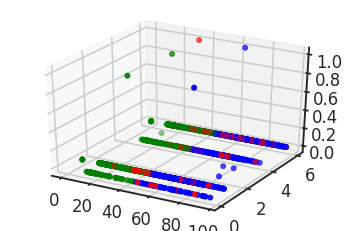

age_yrs vs age_yrs vs vax_route


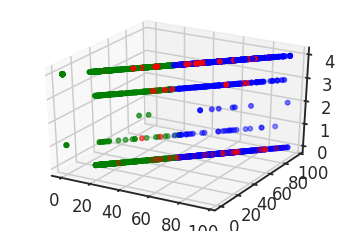

age_yrs vs age_yrs vs onset_vax


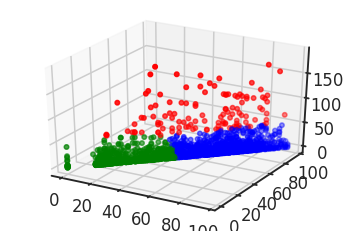

age_yrs vs age_yrs vs sex


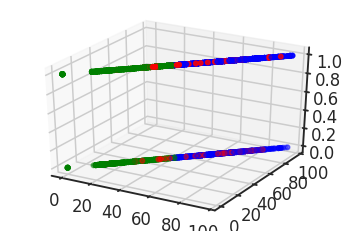

age_yrs vs age_yrs vs er_ed_visit


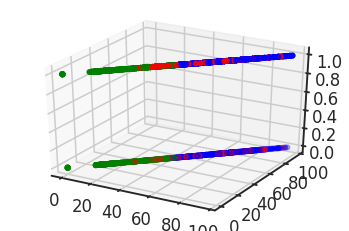

age_yrs vs age_yrs vs l_threat


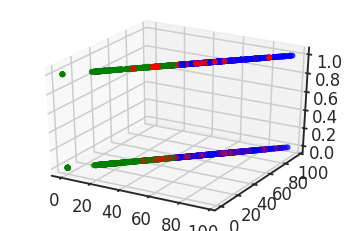

age_yrs vs age_yrs vs disable


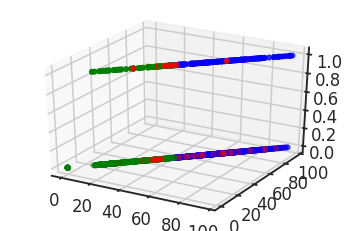

age_yrs vs age_yrs vs died


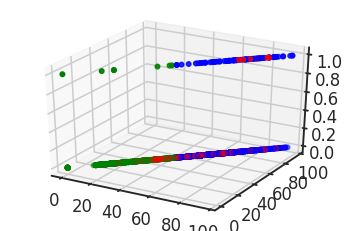

age_yrs vs age_yrs vs hospdays


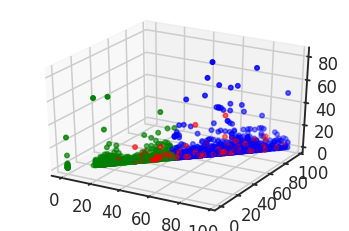

age_yrs vs age_yrs vs recovd


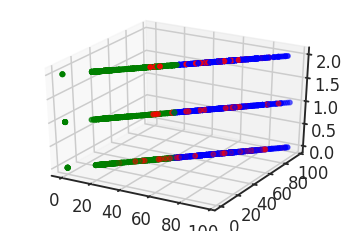

age_yrs vs age_yrs vs infarct_myocardic


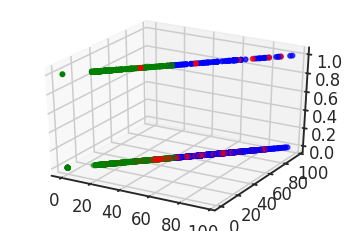

age_yrs vs age_yrs vs coagulopathy


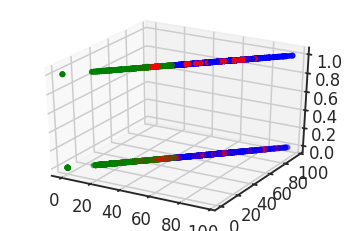

age_yrs vs age_yrs vs epilepsy_convulsions


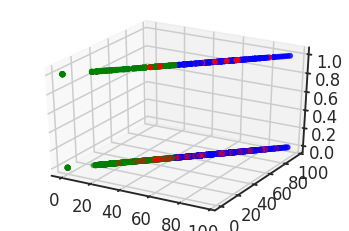

age_yrs vs age_yrs vs covid19


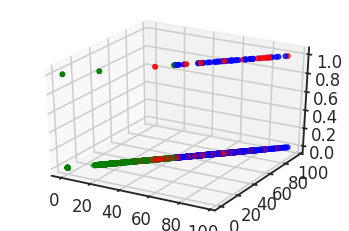

age_yrs vs age_yrs vs guillain


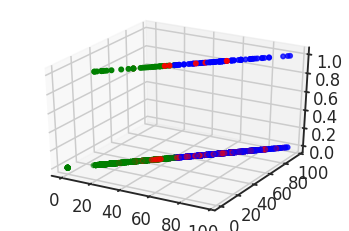

age_yrs vs age_yrs vs stroke


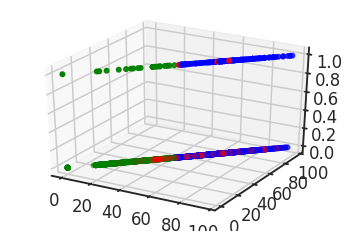

age_yrs vs age_yrs vs transverse_myelitis


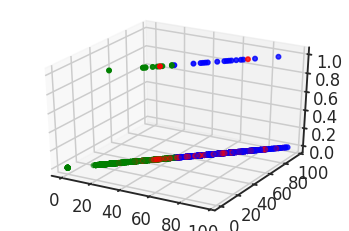

age_yrs vs age_yrs vs adem


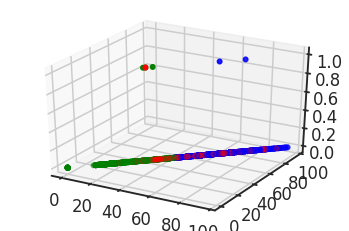

age_yrs vs age_yrs vs encephalomyelitis


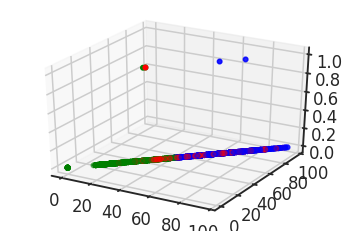

age_yrs vs er_ed_visit vs vax_route


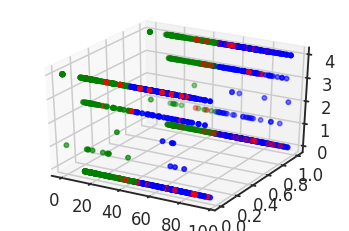

age_yrs vs er_ed_visit vs onset_vax


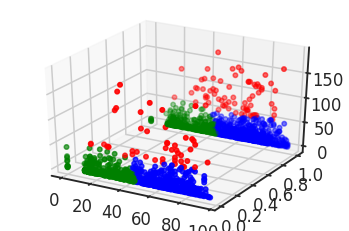

age_yrs vs er_ed_visit vs sex


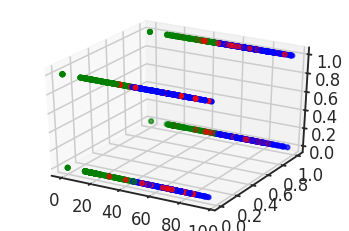

age_yrs vs er_ed_visit vs l_threat


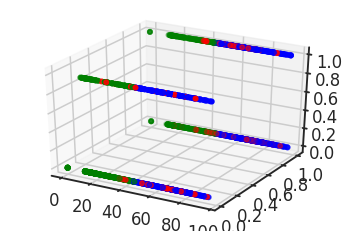

age_yrs vs er_ed_visit vs disable


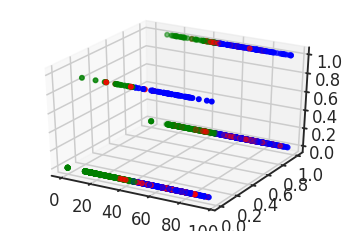

age_yrs vs er_ed_visit vs died


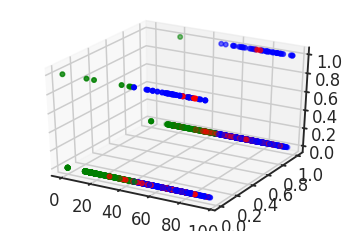

age_yrs vs er_ed_visit vs hospdays


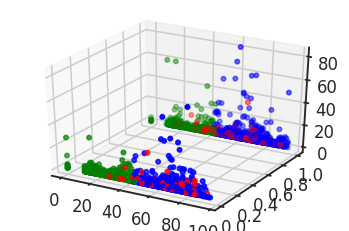

age_yrs vs er_ed_visit vs recovd


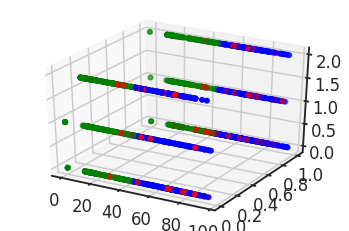

age_yrs vs er_ed_visit vs infarct_myocardic


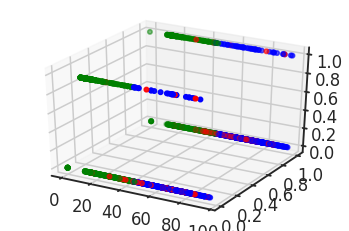

age_yrs vs er_ed_visit vs coagulopathy


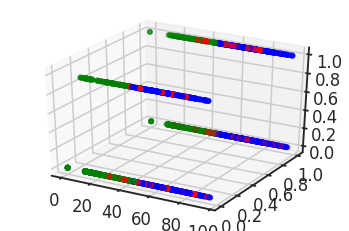

age_yrs vs er_ed_visit vs epilepsy_convulsions


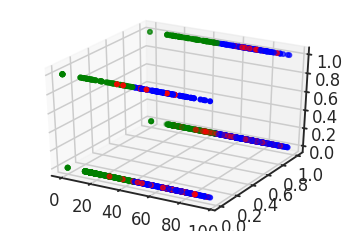

age_yrs vs er_ed_visit vs covid19


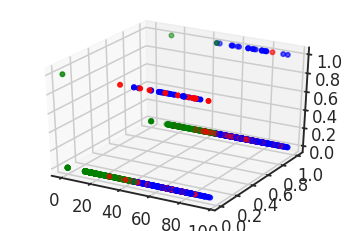

age_yrs vs er_ed_visit vs guillain


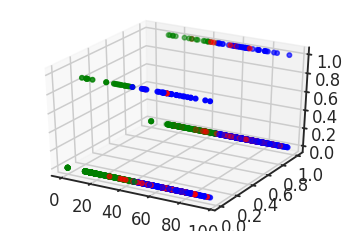

age_yrs vs er_ed_visit vs stroke


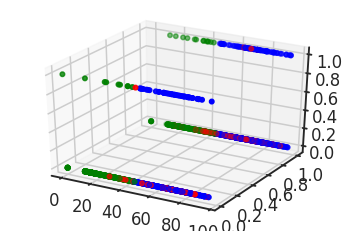

age_yrs vs er_ed_visit vs transverse_myelitis


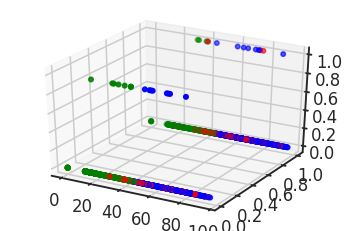

age_yrs vs er_ed_visit vs adem


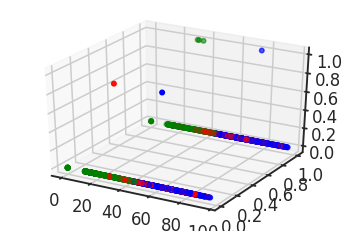

age_yrs vs er_ed_visit vs encephalomyelitis


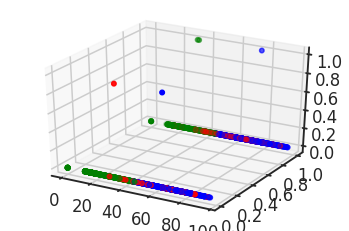

age_yrs vs disable vs vax_route


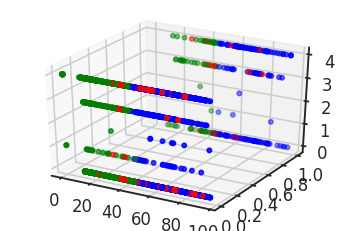

age_yrs vs disable vs onset_vax


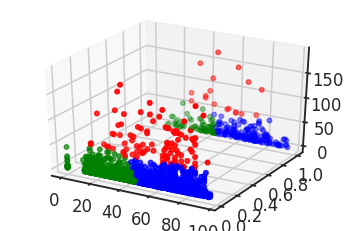

age_yrs vs disable vs sex


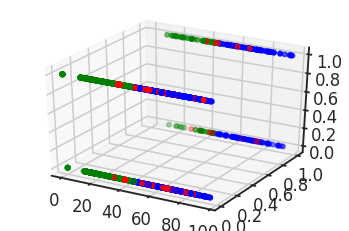

age_yrs vs disable vs l_threat


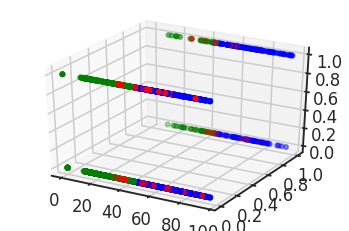

age_yrs vs disable vs died


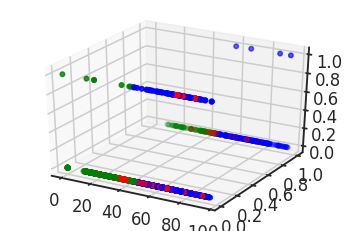

age_yrs vs disable vs hospdays


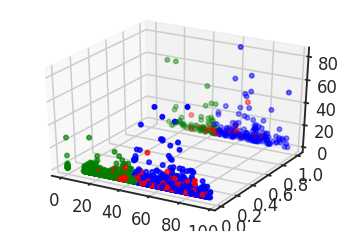

age_yrs vs disable vs recovd


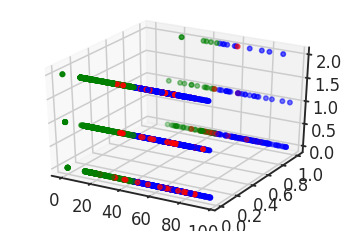

age_yrs vs disable vs infarct_myocardic


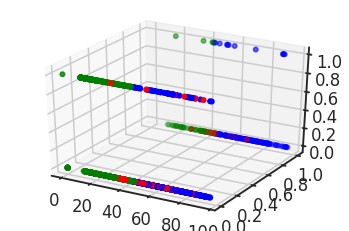

age_yrs vs disable vs coagulopathy


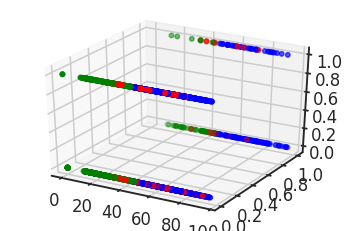

age_yrs vs disable vs epilepsy_convulsions


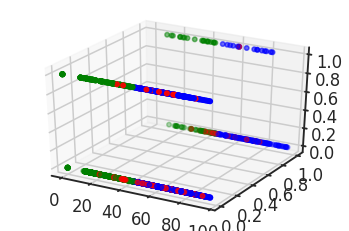

age_yrs vs disable vs covid19


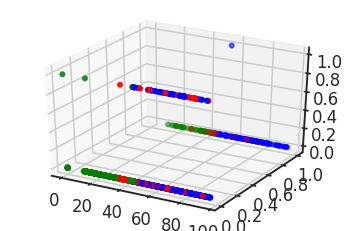

age_yrs vs disable vs guillain


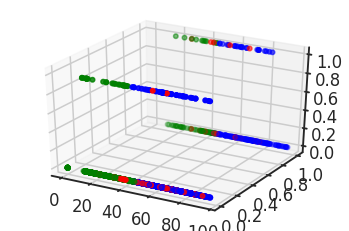

age_yrs vs disable vs stroke


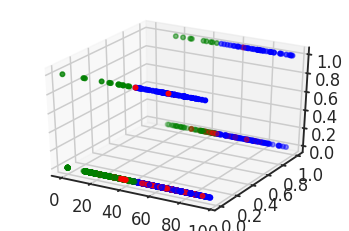

age_yrs vs disable vs transverse_myelitis


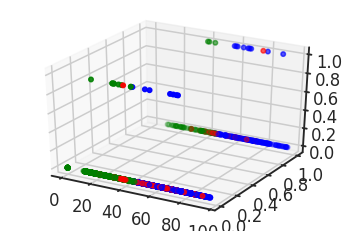

age_yrs vs disable vs adem


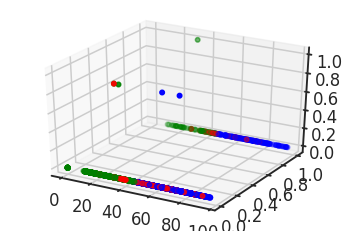

age_yrs vs disable vs encephalomyelitis


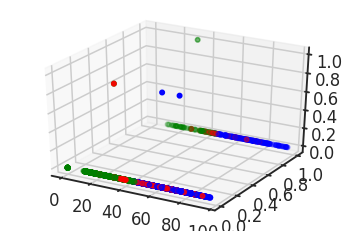

age_yrs vs hospdays vs vax_route


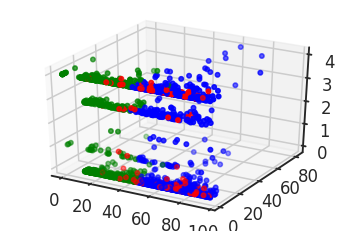

age_yrs vs hospdays vs onset_vax


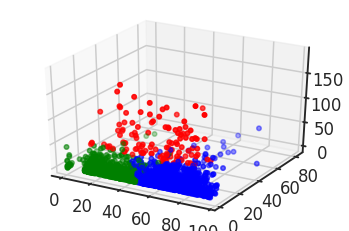

age_yrs vs hospdays vs sex


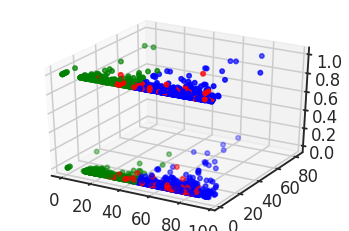

age_yrs vs hospdays vs l_threat


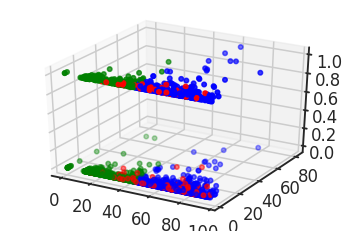

age_yrs vs hospdays vs died


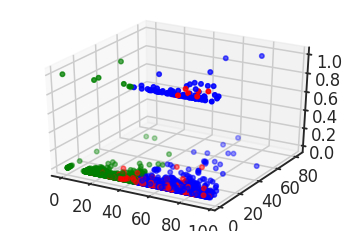

age_yrs vs hospdays vs recovd


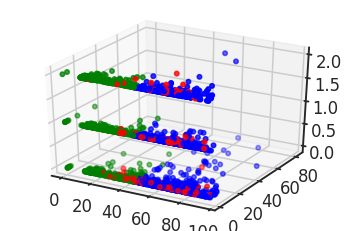

age_yrs vs hospdays vs infarct_myocardic


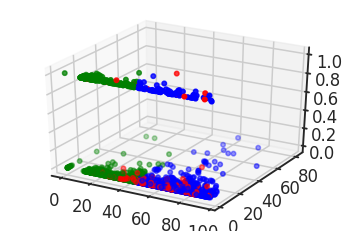

age_yrs vs hospdays vs coagulopathy


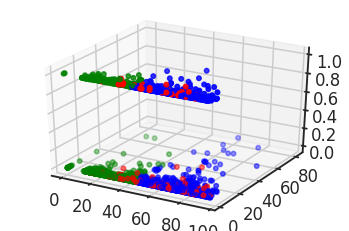

age_yrs vs hospdays vs epilepsy_convulsions


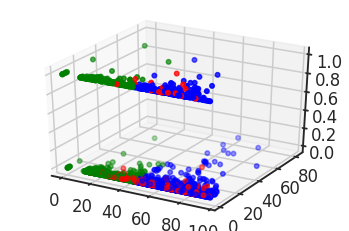

age_yrs vs hospdays vs covid19


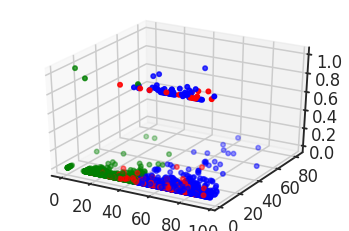

age_yrs vs hospdays vs guillain


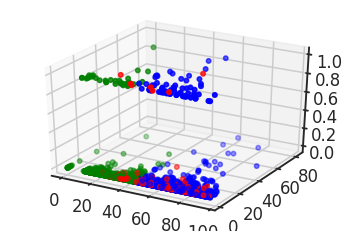

age_yrs vs hospdays vs stroke


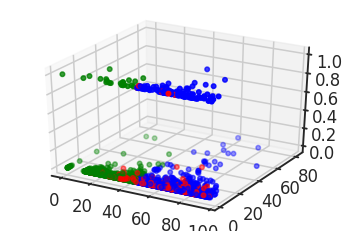

age_yrs vs hospdays vs transverse_myelitis


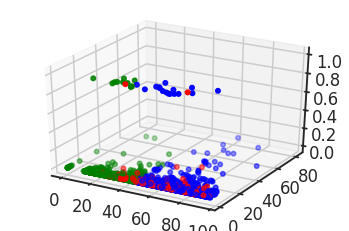

age_yrs vs hospdays vs adem


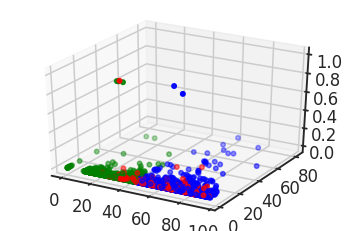

age_yrs vs hospdays vs encephalomyelitis


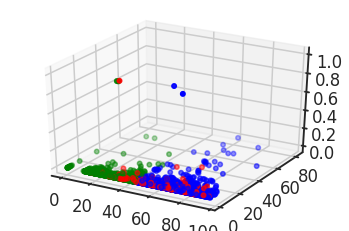

age_yrs vs infarct_myocardic vs vax_route


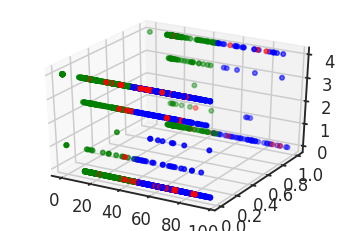

age_yrs vs infarct_myocardic vs onset_vax


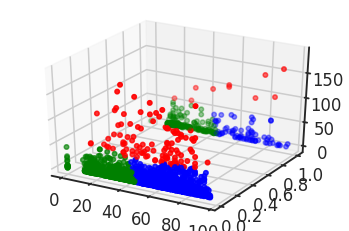

age_yrs vs infarct_myocardic vs sex


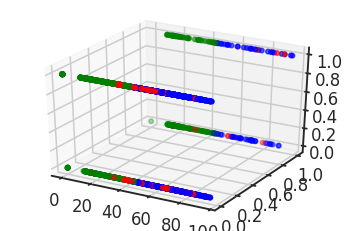

age_yrs vs infarct_myocardic vs l_threat


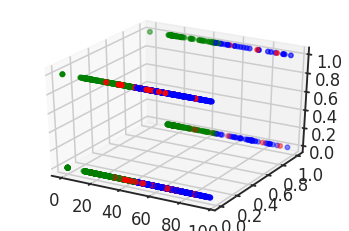

age_yrs vs infarct_myocardic vs died


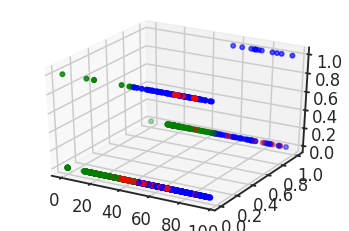

age_yrs vs infarct_myocardic vs recovd


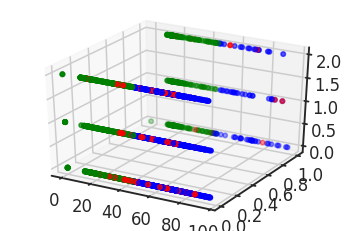

age_yrs vs infarct_myocardic vs coagulopathy


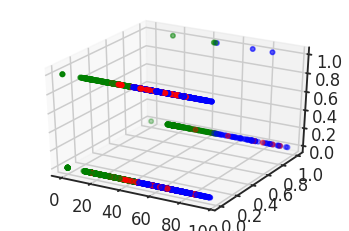

age_yrs vs infarct_myocardic vs epilepsy_convulsions


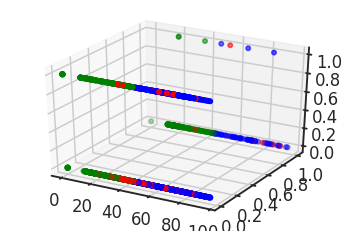

age_yrs vs infarct_myocardic vs covid19


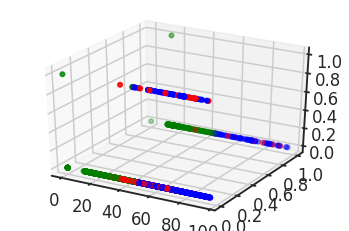

age_yrs vs infarct_myocardic vs guillain


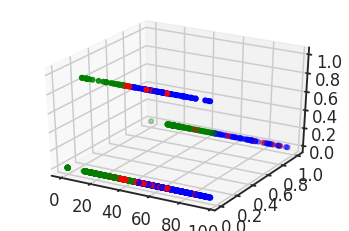

age_yrs vs infarct_myocardic vs stroke


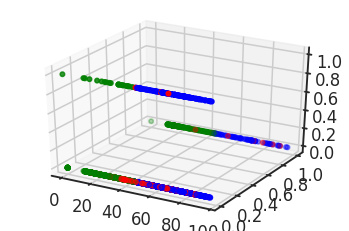

age_yrs vs infarct_myocardic vs transverse_myelitis


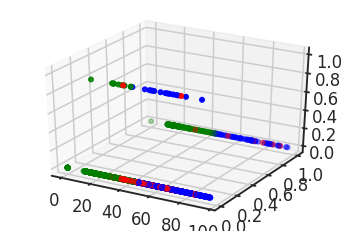

age_yrs vs infarct_myocardic vs adem


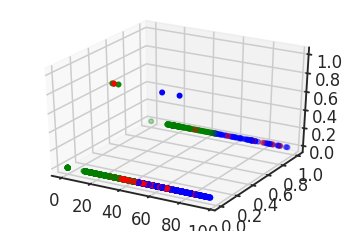

age_yrs vs infarct_myocardic vs encephalomyelitis


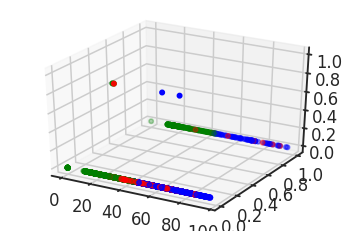

age_yrs vs epilepsy_convulsions vs vax_route


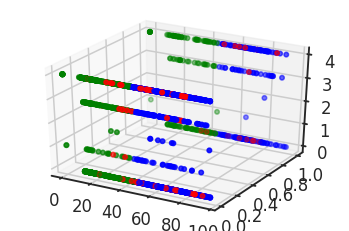

age_yrs vs epilepsy_convulsions vs onset_vax


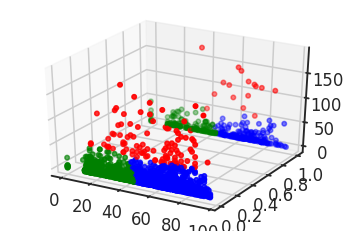

age_yrs vs epilepsy_convulsions vs sex


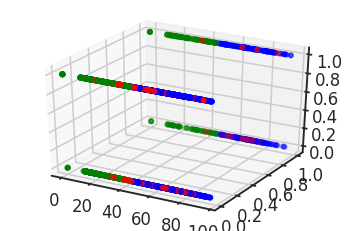

age_yrs vs epilepsy_convulsions vs l_threat


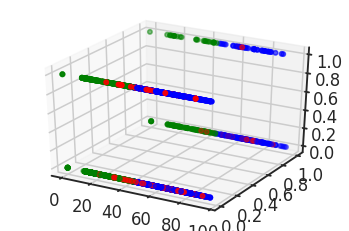

age_yrs vs epilepsy_convulsions vs died


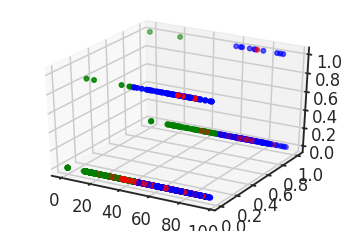

age_yrs vs epilepsy_convulsions vs recovd


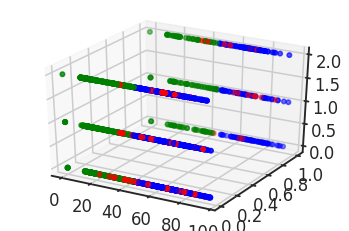

age_yrs vs epilepsy_convulsions vs coagulopathy


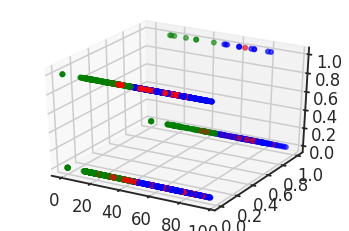

age_yrs vs epilepsy_convulsions vs covid19


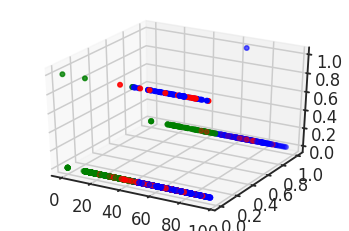

age_yrs vs epilepsy_convulsions vs guillain


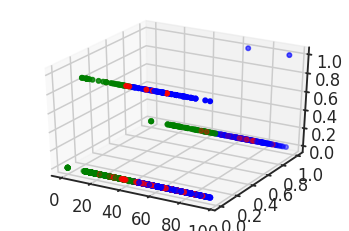

age_yrs vs epilepsy_convulsions vs stroke


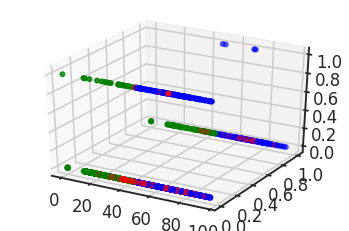

age_yrs vs epilepsy_convulsions vs transverse_myelitis


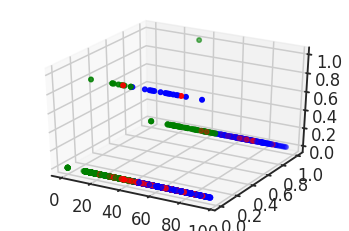

age_yrs vs epilepsy_convulsions vs adem


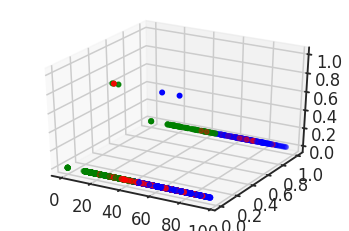

age_yrs vs epilepsy_convulsions vs encephalomyelitis


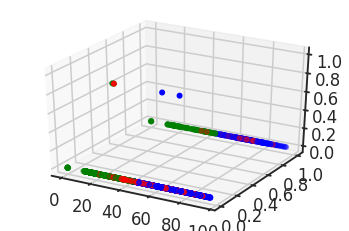

age_yrs vs guillain vs vax_route


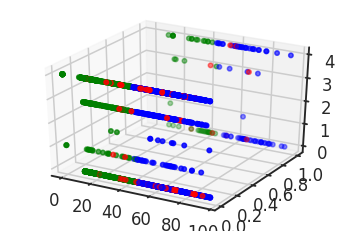

age_yrs vs guillain vs onset_vax


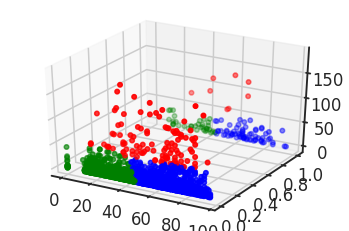

age_yrs vs guillain vs sex


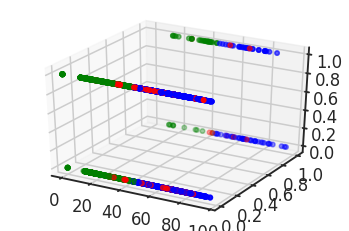

age_yrs vs guillain vs l_threat


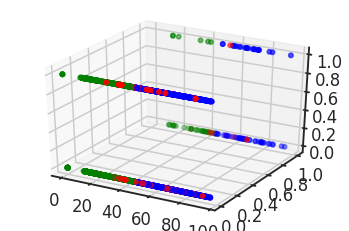

age_yrs vs guillain vs died


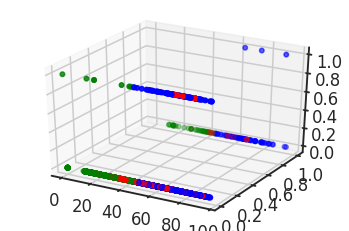

age_yrs vs guillain vs recovd


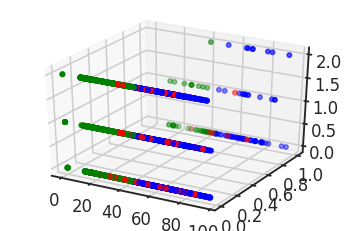

age_yrs vs guillain vs coagulopathy


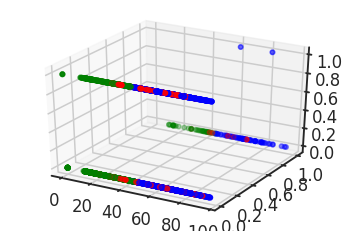

age_yrs vs guillain vs covid19


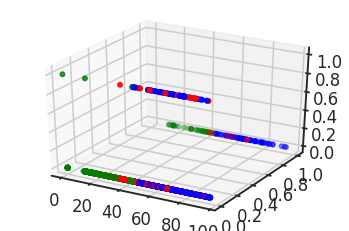

age_yrs vs guillain vs stroke


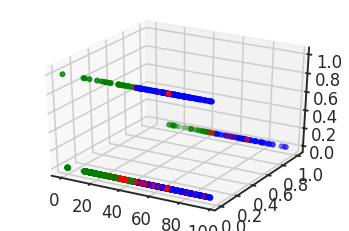

age_yrs vs guillain vs transverse_myelitis


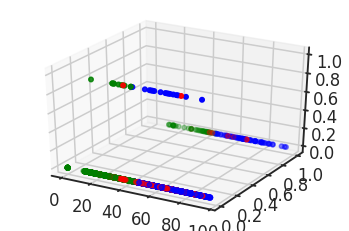

age_yrs vs guillain vs adem


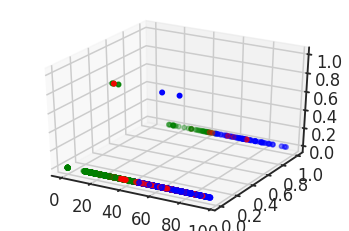

age_yrs vs guillain vs encephalomyelitis


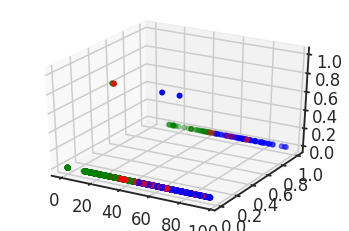

age_yrs vs transverse_myelitis vs vax_route


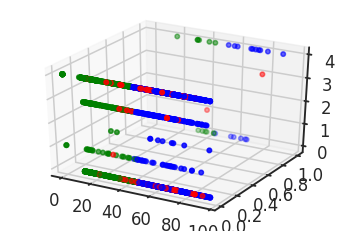

age_yrs vs transverse_myelitis vs onset_vax


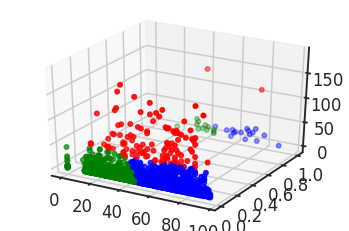

age_yrs vs transverse_myelitis vs sex


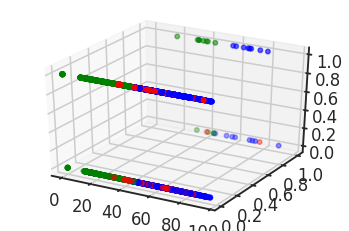

age_yrs vs transverse_myelitis vs l_threat


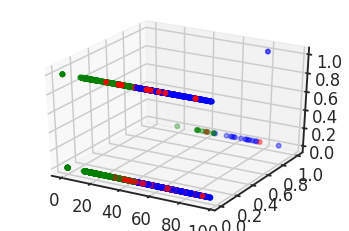

age_yrs vs transverse_myelitis vs died


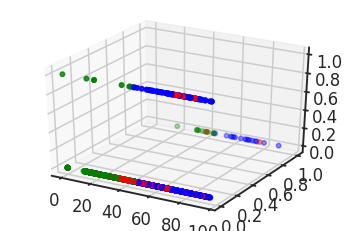

age_yrs vs transverse_myelitis vs recovd


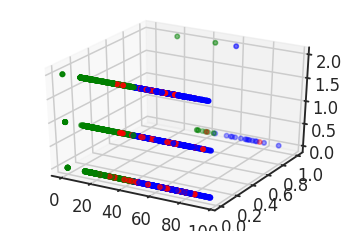

age_yrs vs transverse_myelitis vs coagulopathy


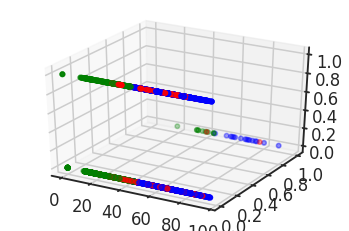

age_yrs vs transverse_myelitis vs covid19


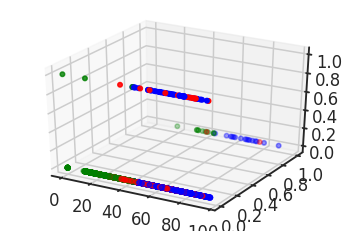

age_yrs vs transverse_myelitis vs stroke


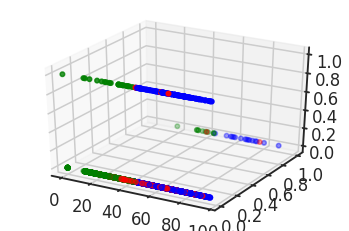

age_yrs vs transverse_myelitis vs adem


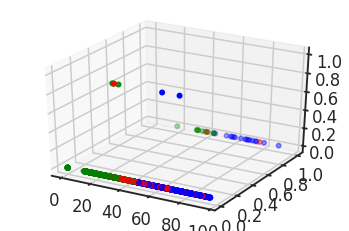

age_yrs vs transverse_myelitis vs encephalomyelitis


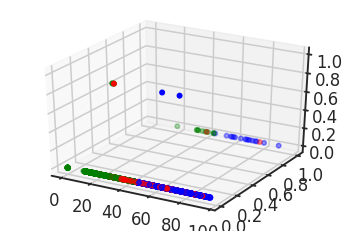

age_yrs vs encephalomyelitis vs vax_route


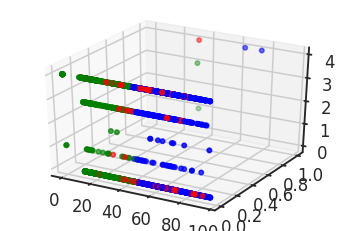

age_yrs vs encephalomyelitis vs onset_vax


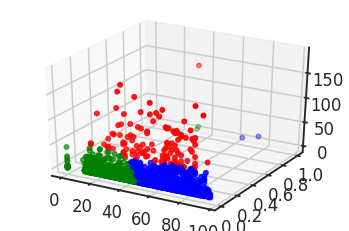

age_yrs vs encephalomyelitis vs sex


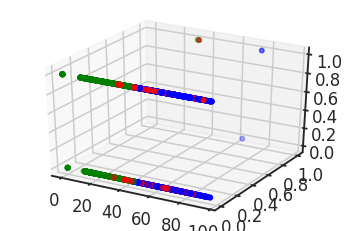

age_yrs vs encephalomyelitis vs l_threat


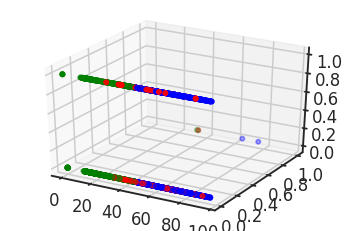

age_yrs vs encephalomyelitis vs died


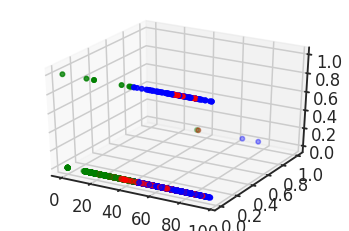

age_yrs vs encephalomyelitis vs recovd


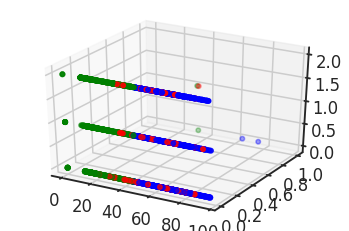

age_yrs vs encephalomyelitis vs coagulopathy


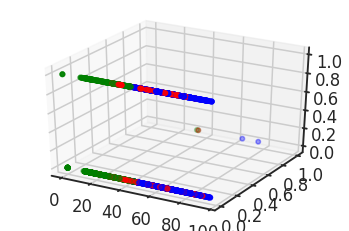

age_yrs vs encephalomyelitis vs covid19


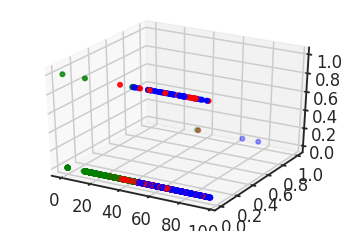

age_yrs vs encephalomyelitis vs stroke


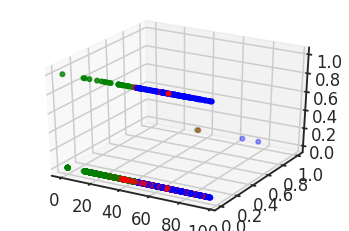

age_yrs vs encephalomyelitis vs adem


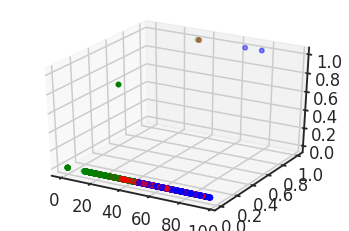

In [124]:
colormap = np.array(['Red', 'Blue', 'Green'])
variables=list(data_modelamiento.columns)
for element in variables :
  variables.remove(element)
  for e in variables :
    print('age_yrs'+" vs "+element+ " vs "+e)
    fig = plt.figure()
    ax = plt.axes(projection='3d')
    ax.scatter3D(data_modelamiento['age_yrs'], data_modelamiento[element],data_modelamiento[e], c=colormap[kmeans.labels_]);
    plt.show()

In [ ]:
#Me ganó el sueño aajja